In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/recodai-luc-scientific-image-forgery-detection/sample_submission.csv
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/50028.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/18054.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/32154.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/51742.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/60154.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/22739.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/59655.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/20985.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/57328.png
/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images/forged/49613.png
/kaggle

Install Desired Libraries

In [3]:
!pip install -q segmentation-models-pytorch==0.3.3 --no-deps
!pip install -q timm
!pip install -q pretrainedmodels
!pip install -q efficientnet_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
segmentation-models-pytorch 0.3.3 requires efficientnet-pytorch==0.7.1, which is not installed.
segmentation-models-pytorch 0.3.3 requires timm==0.9.2, but you have timm 1.0.20 which is incompatible.
  Preparing metadata (setup.py) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
segmentation-models-pytorch 0.3.3 requires timm==0.9.2, but you have timm 1.0.20 which is incompatible.


**Train Model**

Display Training Loss****

New

In [ ]:
# -----------------------------
# Imports
# -----------------------------
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
import torch.optim as optim

from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp

# -----------------------------
# User Config
# -----------------------------
# -----------------------------
# User Config
# -----------------------------
IMAGE_DIR = "/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images"
MASK_DIR  = "/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_masks"
IMG_SIZE  = (256, 256)
BATCH_SIZE = 8
NUM_EPOCHS = 50
RANDOM_STATE = 42
NUM_WORKERS = 4
LR = 1e-4  # <-- ADD THIS LINE
MODEL_SAVE_PATH = "best_model.pth"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

# -----------------------------
# Dice & IoU functions
# -----------------------------
def dice_coef_mask(pred, target, eps=1e-7):
    intersection = (pred * target).sum(dim=(1,2))
    union = pred.sum(dim=(1,2)) + target.sum(dim=(1,2))
    return (2. * intersection + eps) / (union + eps)

def iou_mask(pred, target, eps=1e-7):
    inter = (pred * target).sum(dim=(1,2))
    union = (pred + target - pred*target).sum(dim=(1,2))
    return (inter + eps) / (union + eps)

class DiceLoss(nn.Module):
    def __init__(self, eps=1e-7):
        super().__init__()
        self.eps = eps
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs = probs.view(probs.size(0), -1)
        targets = targets.view(targets.size(0), -1)
        intersection = (probs * targets).sum(dim=1)
        union = probs.sum(dim=1) + targets.sum(dim=1)
        loss = 1 - ((2 * intersection + self.eps) / (union + self.eps))
        return loss.mean()

# -----------------------------
# Mask loader
# -----------------------------
def find_mask_file(mask_dir, img_name):
    stem = Path(img_name).stem
    patterns = [f"{stem}.npy", f"{stem}_mask.npy", f"{stem}.npz"]
    for p in patterns:
        pth = os.path.join(mask_dir, p)
        if os.path.exists(pth):
            return pth
    for root, _, files in os.walk(mask_dir):
        for f in files:
            if Path(f).stem == stem:
                return os.path.join(root, f)
    return None

def load_mask_safe(mask_path, target_shape):
    if mask_path is None:
        return np.zeros(target_shape, dtype=np.uint8)
    arr = np.load(mask_path, allow_pickle=True)
    if isinstance(arr, np.lib.npyio.NpzFile):
        arr = arr[list(arr.keys())[0]]
    arr = np.squeeze(arr)
    if arr.dtype != np.uint8 and arr.dtype != np.bool_:
        arr = (arr > 0.5).astype(np.uint8)
    if arr.ndim == 3:
        arr = (np.mean(arr, axis=-1) > 0.5).astype(np.uint8)
    if arr.shape != target_shape:
        arr_resized = cv2.resize((arr*255).astype(np.uint8), (target_shape[1], target_shape[0]), interpolation=cv2.INTER_NEAREST)
        arr = (arr_resized > 127).astype(np.uint8)
    return arr

# -----------------------------
# Dataset
# -----------------------------
class ForgerySegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, img_size=(256,256)):
        self.img_size = img_size
        self.image_paths = []
        for sub in ["authentic", "forged"]:
            pth = os.path.join(image_dir, sub)
            if os.path.isdir(pth):
                for fname in sorted(os.listdir(pth)):
                    if fname.lower().endswith((".png",".jpg",".jpeg",".tiff")):
                        self.image_paths.append(os.path.join(pth, fname))
        self.mask_paths = [find_mask_file(mask_dir, Path(p).name) for p in self.image_paths]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resized = cv2.resize(img, (self.img_size[1], self.img_size[0]))
        mask = load_mask_safe(mask_path, (self.img_size[0], self.img_size[1]))
        img_tensor = torch.from_numpy(img_resized.transpose(2,0,1)).float().div(255.0)
        mask_tensor = torch.from_numpy(mask).unsqueeze(0).float()
        return img_tensor, mask_tensor

# -----------------------------
# Load dataset and split 80/20
# -----------------------------
dataset = ForgerySegmentationDataset(IMAGE_DIR, MASK_DIR, img_size=IMG_SIZE)
train_idx, val_idx = train_test_split(
    list(range(len(dataset))),
    test_size=0.2,
    random_state=RANDOM_STATE,
    shuffle=True
)

print(f"Total images in dataset: {len(dataset)}")
print(f"Training images (80%): {len(train_idx)}")
print(f"Validation images (20%): {len(val_idx)}")

train_loader = DataLoader(
    Subset(dataset, train_idx),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader = DataLoader(
    Subset(dataset, val_idx),
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# -----------------------------
# Model, loss, optimizer
# -----------------------------
model = smp.Unet(encoder_name="efficientnet-b0", encoder_weights="imagenet", in_channels=3, classes=1)
model.to(DEVICE)

bce = nn.BCEWithLogitsLoss()
dice = DiceLoss()
def combined_loss(logits, targets):
    return bce(logits, targets) + dice(logits, targets)

optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=2)

# -----------------------------
# Training Loop with metrics tracking
# -----------------------------
scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
best_val = 1e9

train_losses_all, val_losses_all = [], []
train_dices_all, val_dices_all = [], []
train_ious_all, val_ious_all = [], []

for epoch in range(1, NUM_EPOCHS+1):
    # TRAIN
    model.train()
    train_losses, train_dices, train_ious = [], [], []
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch} TRAIN"):
        images, masks = images.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')
            loss = combined_loss(logits, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_losses.append(loss.item())
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float().squeeze(1)
        gts = masks.squeeze(1)
        train_dices.append(dice_coef_mask(preds, gts).mean().item())
        train_ious.append(iou_mask(preds, gts).mean().item())
    avg_train_loss = np.mean(train_losses)
    avg_train_dice = np.mean(train_dices)
    avg_train_iou  = np.mean(train_ious)

    # VALIDATION
    model.eval()
    val_losses, val_dices, val_ious = [], [], []
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch} VAL"):
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')
            loss = combined_loss(logits, masks)
            val_losses.append(loss.item())
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float().squeeze(1)
            gts = masks.squeeze(1)
            val_dices.append(dice_coef_mask(preds, gts).mean().item())
            val_ious.append(iou_mask(preds, gts).mean().item())
    avg_val_loss = np.mean(val_losses)
    avg_val_dice = np.mean(val_dices)
    avg_val_iou  = np.mean(val_ious)

    print(f"Epoch {epoch}: Train Loss {avg_train_loss:.4f}, Val Loss {avg_val_loss:.4f}, "
          f"Train Dice {avg_train_dice:.4f}, Val Dice {avg_val_dice:.4f}, "
          f"Train IoU {avg_train_iou:.4f}, Val IoU {avg_val_iou:.4f}")

    # Save metrics
    train_losses_all.append(avg_train_loss)
    val_losses_all.append(avg_val_loss)
    train_dices_all.append(avg_train_dice)
    val_dices_all.append(avg_val_dice)
    train_ious_all.append(avg_train_iou)
    val_ious_all.append(avg_val_iou)

    # Scheduler step
    scheduler.step(avg_val_loss)

    # Save best model
    if avg_val_loss < best_val:
        best_val = avg_val_loss
        torch.save(model.state_dict(), MODEL_SAVE_PATH)
        print("Saved best model:", MODEL_SAVE_PATH)

# -----------------------------
# Plot Metrics and save
# -----------------------------
output_dir = "/kaggle/working/plots"
os.makedirs(output_dir, exist_ok=True)
plt.figure(figsize=(12,4))

# Loss
plt.subplot(1,2,1)
plt.plot(train_losses_all, label="Train Loss", linewidth=2)
plt.plot(val_losses_all, label="Val Loss", linewidth=2)
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Loss", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title("Loss Curve", fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)

# Dice & IoU
plt.subplot(1,2,2)
plt.plot(train_dices_all, label="Train Dice", linewidth=2)
plt.plot(val_dices_all, label="Val Dice", linewidth=2)
plt.plot(train_ious_all, label="Train IoU", linewidth=2)
plt.plot(val_ious_all, label="Val IoU", linewidth=2)
plt.xlabel("Epoch", fontsize=16)
plt.ylabel("Score", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title("Dice & IoU", fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)

save_path = os.path.join(output_dir, "training_metrics.png")
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()
print(f"Figure saved at: {save_path}")


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

Device: cuda
Total images in dataset: 5128
Training images (80%): 4102
Validation images (20%): 1026
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


100%|██████████| 20.4M/20.4M [00:00<00:00, 138MB/s]
/tmp/ipykernel_55/1354022033.py:173: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
Epoch 1 TRAIN:   0%|          | 0/513 [00:00<?, ?it/s]/tmp/ipykernel_55/1354022033.py:187: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
Epoch 1 VAL: 100%|██████████| 129/129 [00:19<00:00,  6.51it/s]


Epoch 1: Train Loss 1.4277, Val Loss 1.1461, Train Dice 0.1416, Val Dice 0.3490, Train IoU 0.1094, Val IoU 0.3143
Saved best model: best_model.pth


Epoch 2 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.34it/s]


Epoch 2: Train Loss 1.0881, Val Loss 1.0207, Train Dice 0.2750, Val Dice 0.3029, Train IoU 0.2294, Val IoU 0.2486
Saved best model: best_model.pth


Epoch 3 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.42it/s]


Epoch 3: Train Loss 0.9950, Val Loss 0.9604, Train Dice 0.2623, Val Dice 0.2803, Train IoU 0.1986, Val IoU 0.2169
Saved best model: best_model.pth


Epoch 4 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.29it/s]


Epoch 4: Train Loss 0.9299, Val Loss 0.9200, Train Dice 0.2922, Val Dice 0.3206, Train IoU 0.2221, Val IoU 0.2540
Saved best model: best_model.pth


Epoch 5 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.33it/s]


Epoch 5: Train Loss 0.8768, Val Loss 0.8977, Train Dice 0.3266, Val Dice 0.2960, Train IoU 0.2533, Val IoU 0.2252
Saved best model: best_model.pth


Epoch 6 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.38it/s]


Epoch 6: Train Loss 0.8343, Val Loss 0.8771, Train Dice 0.3558, Val Dice 0.3324, Train IoU 0.2811, Val IoU 0.2620
Saved best model: best_model.pth


Epoch 7 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.49it/s]


Epoch 7: Train Loss 0.8011, Val Loss 0.8684, Train Dice 0.3741, Val Dice 0.3304, Train IoU 0.2975, Val IoU 0.2614
Saved best model: best_model.pth


Epoch 8 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.41it/s]


Epoch 8: Train Loss 0.7730, Val Loss 0.8556, Train Dice 0.3945, Val Dice 0.3453, Train IoU 0.3165, Val IoU 0.2741
Saved best model: best_model.pth


Epoch 9 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.53it/s]


Epoch 9: Train Loss 0.7508, Val Loss 0.8468, Train Dice 0.4115, Val Dice 0.3509, Train IoU 0.3328, Val IoU 0.2782
Saved best model: best_model.pth


Epoch 10 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.49it/s]


Epoch 10: Train Loss 0.7290, Val Loss 0.8284, Train Dice 0.4353, Val Dice 0.3730, Train IoU 0.3555, Val IoU 0.3002
Saved best model: best_model.pth


Epoch 11 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.54it/s]


Epoch 11: Train Loss 0.7129, Val Loss 0.8305, Train Dice 0.4497, Val Dice 0.3709, Train IoU 0.3703, Val IoU 0.2979


Epoch 12 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.57it/s]


Epoch 12: Train Loss 0.6928, Val Loss 0.8244, Train Dice 0.4716, Val Dice 0.4163, Train IoU 0.3919, Val IoU 0.3441
Saved best model: best_model.pth


Epoch 13 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.44it/s]


Epoch 13: Train Loss 0.6780, Val Loss 0.8293, Train Dice 0.4982, Val Dice 0.3541, Train IoU 0.4185, Val IoU 0.2794


Epoch 14 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.57it/s]


Epoch 14: Train Loss 0.6683, Val Loss 0.8131, Train Dice 0.4981, Val Dice 0.3728, Train IoU 0.4189, Val IoU 0.2986
Saved best model: best_model.pth


Epoch 15 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.54it/s]


Epoch 15: Train Loss 0.6554, Val Loss 0.8168, Train Dice 0.5078, Val Dice 0.4198, Train IoU 0.4284, Val IoU 0.3466


Epoch 16 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.60it/s]


Epoch 16: Train Loss 0.6450, Val Loss 0.8063, Train Dice 0.5237, Val Dice 0.4107, Train IoU 0.4460, Val IoU 0.3374
Saved best model: best_model.pth


Epoch 17 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.49it/s]


Epoch 17: Train Loss 0.6364, Val Loss 0.7993, Train Dice 0.5292, Val Dice 0.3933, Train IoU 0.4512, Val IoU 0.3186
Saved best model: best_model.pth


Epoch 18 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.53it/s]


Epoch 18: Train Loss 0.6312, Val Loss 0.8069, Train Dice 0.5373, Val Dice 0.4399, Train IoU 0.4601, Val IoU 0.3666


Epoch 19 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.51it/s]


Epoch 19: Train Loss 0.6190, Val Loss 0.8215, Train Dice 0.5537, Val Dice 0.4451, Train IoU 0.4772, Val IoU 0.3709


Epoch 20 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.53it/s]


Epoch 20: Train Loss 0.6121, Val Loss 0.8096, Train Dice 0.5559, Val Dice 0.4103, Train IoU 0.4799, Val IoU 0.3359


Epoch 21 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.72it/s]


Epoch 21: Train Loss 0.5964, Val Loss 0.7911, Train Dice 0.5790, Val Dice 0.4349, Train IoU 0.5044, Val IoU 0.3609
Saved best model: best_model.pth


Epoch 22 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.70it/s]


Epoch 22: Train Loss 0.5851, Val Loss 0.8095, Train Dice 0.5844, Val Dice 0.4472, Train IoU 0.5109, Val IoU 0.3738


Epoch 23 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.76it/s]


Epoch 23: Train Loss 0.5773, Val Loss 0.8031, Train Dice 0.6005, Val Dice 0.4404, Train IoU 0.5280, Val IoU 0.3665


Epoch 24 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.78it/s]


Epoch 24: Train Loss 0.5700, Val Loss 0.8051, Train Dice 0.6128, Val Dice 0.4301, Train IoU 0.5411, Val IoU 0.3566


Epoch 25 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.71it/s]


Epoch 25: Train Loss 0.5646, Val Loss 0.8017, Train Dice 0.6105, Val Dice 0.4815, Train IoU 0.5393, Val IoU 0.4092


Epoch 26 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.71it/s]


Epoch 26: Train Loss 0.5583, Val Loss 0.7995, Train Dice 0.6149, Val Dice 0.4682, Train IoU 0.5448, Val IoU 0.3960


Epoch 27 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.73it/s]


Epoch 27: Train Loss 0.5548, Val Loss 0.7979, Train Dice 0.6305, Val Dice 0.4757, Train IoU 0.5605, Val IoU 0.4034


Epoch 28 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.72it/s]


Epoch 28: Train Loss 0.5485, Val Loss 0.7996, Train Dice 0.6388, Val Dice 0.4684, Train IoU 0.5699, Val IoU 0.3958


Epoch 29 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.72it/s]


Epoch 29: Train Loss 0.5475, Val Loss 0.7978, Train Dice 0.6382, Val Dice 0.4585, Train IoU 0.5692, Val IoU 0.3860


Epoch 30 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.65it/s]


Epoch 30: Train Loss 0.5430, Val Loss 0.8041, Train Dice 0.6523, Val Dice 0.4704, Train IoU 0.5842, Val IoU 0.3980


Epoch 31 VAL: 100%|██████████| 129/129 [00:18<00:00,  7.16it/s]


Epoch 31: Train Loss 0.5418, Val Loss 0.7966, Train Dice 0.6424, Val Dice 0.4640, Train IoU 0.5743, Val IoU 0.3918


Epoch 32 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.24it/s]


Epoch 32: Train Loss 0.5413, Val Loss 0.8014, Train Dice 0.6427, Val Dice 0.4716, Train IoU 0.5747, Val IoU 0.3993


Epoch 33 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.56it/s]


Epoch 33: Train Loss 0.5402, Val Loss 0.8000, Train Dice 0.6424, Val Dice 0.4687, Train IoU 0.5746, Val IoU 0.3961


Epoch 34 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.56it/s]


Epoch 34: Train Loss 0.5375, Val Loss 0.8008, Train Dice 0.6500, Val Dice 0.4746, Train IoU 0.5825, Val IoU 0.4024


Epoch 35 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.63it/s]


Epoch 35: Train Loss 0.5371, Val Loss 0.7988, Train Dice 0.6565, Val Dice 0.4666, Train IoU 0.5893, Val IoU 0.3943


Epoch 36 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.46it/s]


Epoch 36: Train Loss 0.5371, Val Loss 0.8005, Train Dice 0.6491, Val Dice 0.4742, Train IoU 0.5817, Val IoU 0.4019


Epoch 37 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.61it/s]


Epoch 37: Train Loss 0.5368, Val Loss 0.8002, Train Dice 0.6518, Val Dice 0.4721, Train IoU 0.5847, Val IoU 0.3998


Epoch 38 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.61it/s]


Epoch 38: Train Loss 0.5351, Val Loss 0.7994, Train Dice 0.6478, Val Dice 0.4669, Train IoU 0.5809, Val IoU 0.3946


Epoch 39 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.65it/s]


Epoch 39: Train Loss 0.5361, Val Loss 0.7989, Train Dice 0.6537, Val Dice 0.4753, Train IoU 0.5866, Val IoU 0.4032


Epoch 40 VAL: 100%|██████████| 129/129 [00:16<00:00,  7.67it/s]


Epoch 40: Train Loss 0.5360, Val Loss 0.8007, Train Dice 0.6528, Val Dice 0.4712, Train IoU 0.5857, Val IoU 0.3992


Epoch 41 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.57it/s]


Epoch 41: Train Loss 0.5358, Val Loss 0.7996, Train Dice 0.6552, Val Dice 0.4719, Train IoU 0.5882, Val IoU 0.3996


Epoch 42 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.38it/s]


Epoch 42: Train Loss 0.5348, Val Loss 0.7983, Train Dice 0.6531, Val Dice 0.4712, Train IoU 0.5863, Val IoU 0.3990


Epoch 43 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.40it/s]


Epoch 43: Train Loss 0.5338, Val Loss 0.7983, Train Dice 0.6542, Val Dice 0.4768, Train IoU 0.5876, Val IoU 0.4046


Epoch 44 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.51it/s]


Epoch 44: Train Loss 0.5349, Val Loss 0.7980, Train Dice 0.6551, Val Dice 0.4639, Train IoU 0.5884, Val IoU 0.3915


Epoch 45 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.47it/s]


Epoch 45: Train Loss 0.5347, Val Loss 0.8001, Train Dice 0.6565, Val Dice 0.4742, Train IoU 0.5898, Val IoU 0.4022


Epoch 46 VAL: 100%|██████████| 129/129 [00:17<00:00,  7.50it/s]


Epoch 46: Train Loss 0.5331, Val Loss 0.8001, Train Dice 0.6586, Val Dice 0.4796, Train IoU 0.5917, Val IoU 0.4076


Epoch 47 TRAIN:  72%|███████▏  | 368/513 [00:51<00:20,  6.96it/s]

In [1]:
# -----------------------------
# Plot Loss Curves Only
# -----------------------------
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

plt.plot(train_losses_all, label="Train Loss", linewidth=3)
plt.plot(val_losses_all, label="Validation Loss", linewidth=3)

#plt.title("Training and Validation Loss", fontsize=18)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Loss", fontsize=18)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(alpha=0.9)

plt.tight_layout()

# Save to Kaggle working directory
plot_path = "/kaggle/working/loss_curve.png"
plt.savefig(plot_path, dpi=300, bbox_inches="tight")
print(f"✅ Loss curve saved to: {plot_path}")

plt.show()


NameError: name 'train_losses_all' is not defined

<Figure size 800x500 with 0 Axes>

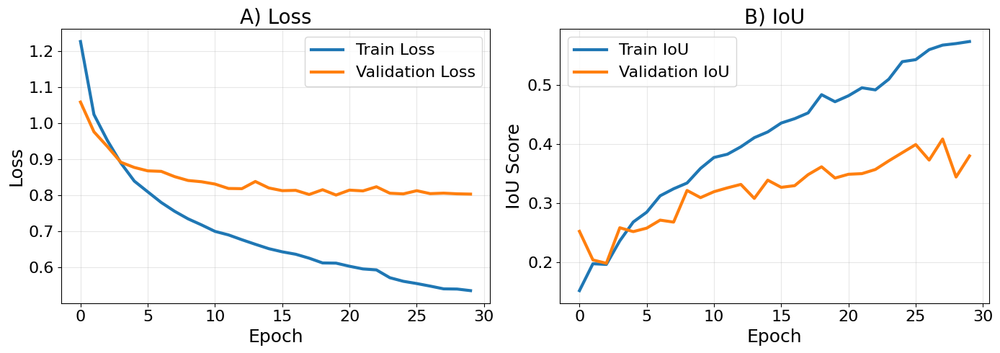

✅ Figure saved at: /kaggle/working/loss_iou_curves.png


In [30]:
# -----------------------------
# One Figure with Two Subplots: A) Loss  B) IoU
# -----------------------------
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 5))

# ---- A) Loss Curve ----
plt.subplot(1, 2, 1)
plt.plot(train_losses_all, label="Train Loss", linewidth=3)
plt.plot(val_losses_all, label="Validation Loss", linewidth=3)
plt.title("A) Loss", fontsize=20)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Loss", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(alpha=0.3)

# ---- B) IoU Curve ----
plt.subplot(1, 2, 2)
plt.plot(train_ious_all, label="Train IoU", linewidth=3)
plt.plot(val_ious_all, label="Validation IoU", linewidth=3)
plt.title("B) IoU", fontsize=20)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("IoU Score", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(alpha=0.3)

plt.tight_layout()

# Save figure
save_path = "/kaggle/working/loss_iou_curves.png"
plt.savefig(save_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"✅ Figure saved at: {save_path}")


✅ Plot saved to: /kaggle/working/training_metrics.png


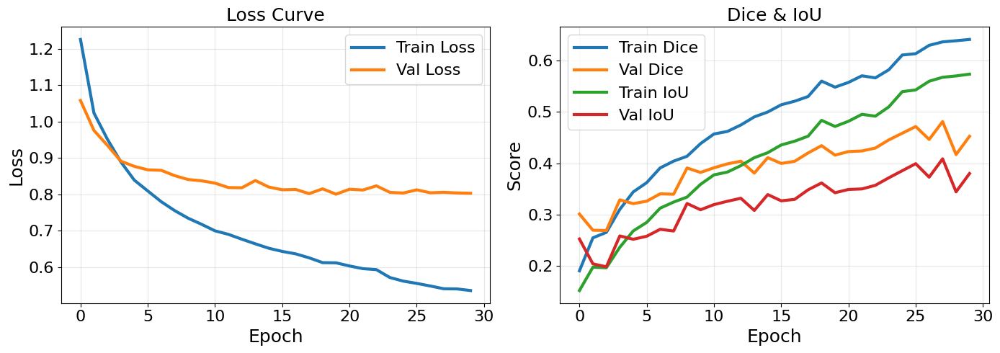

In [31]:
# -----------------------------
# Plot Metrics (Improved Styling)
# -----------------------------
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 5))

# ---- Loss Curve ----
plt.subplot(1, 2, 1)
plt.plot(train_losses_all, label="Train Loss", linewidth=3)
plt.plot(val_losses_all, label="Val Loss", linewidth=3)
plt.title("Loss Curve", fontsize=18)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Loss", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(alpha=0.3)

# ---- Dice & IoU ----
plt.subplot(1, 2, 2)
plt.plot(train_dices_all, label="Train Dice", linewidth=3)
plt.plot(val_dices_all, label="Val Dice", linewidth=3)
plt.plot(train_ious_all, label="Train IoU", linewidth=3)
plt.plot(val_ious_all, label="Val IoU", linewidth=3)
plt.title("Dice & IoU", fontsize=18)
plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Score", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(alpha=0.3)

plt.tight_layout()

# Save to Kaggle working directory
plot_path = "/kaggle/working/training_metrics.png"
plt.savefig(plot_path, dpi=300)
print(f"✅ Plot saved to: {plot_path}")

plt.show()


**Display Only Loss Plot**


FULL DATASET IMAGE STATISTICS
Total images           : 5128
Authentic images (0)   : 2377
Forged images (1)      : 2751

25% TRAINING DATA USED AS TEST (IMAGE-LEVEL)
Images used             : 1026
Authentic images (0)    : 481
Forged images (1)       : 545


Pixel-level Evaluation: 100%|██████████| 129/129 [00:17<00:00,  7.40it/s]



PIXEL-LEVEL DISTRIBUTION (25% TRAINING DATA)
Total pixels evaluated  : 67239936
Authentic pixels (0)    : 64232520
Forged pixels (1)       : 3007416
Class ratio (0:1)       : 21.36:1


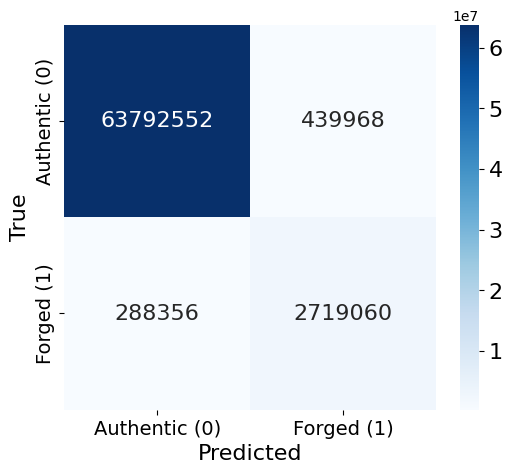

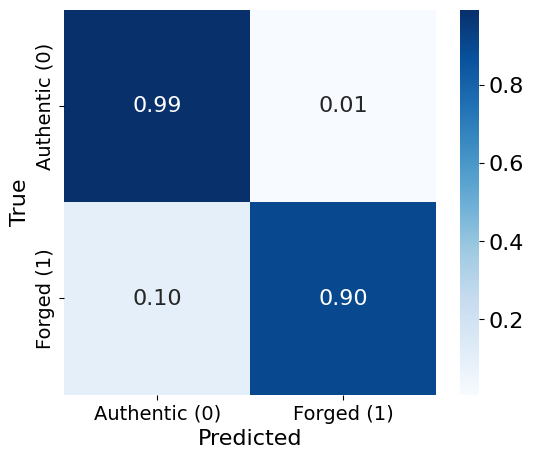


SIMPLE PIXEL-LEVEL CLASSIFICATION METRICS
Class           | Precision |    Recall |  F1-score
--------------------------------------------------------------------------------
Authentic (0)   |    0.9955 |    0.9932 |    0.9943
Forged (1)      |    0.8607 |    0.9041 |    0.8819
--------------------------------------------------------------------------------
Macro Avg       |    0.9281 |    0.9486 |    0.9381


In [34]:
# ============================================================
# COMPLETE PIXEL-LEVEL EVALUATION (25% TRAINING DATA)
# Includes:
# - Image-level statistics (full dataset & 25% subset)
# - Pixel-level confusion matrix
# - Simple Precision / Recall / F1 (per class + macro)
# ============================================================

# -----------------------------
# Imports
# -----------------------------
import os
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score
)
from collections import Counter
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# -----------------------------
# Configuration
# -----------------------------
TEST_FRACTION = 0.25
THRESHOLD = 0.5
SAVE_DIR = "/kaggle/working/pixel_evaluation"
os.makedirs(SAVE_DIR, exist_ok=True)

# -----------------------------
# Helper: infer image class
# -----------------------------
def get_image_class(img_path):
    """
    authentic -> 0
    forged    -> 1
    """
    parts = Path(img_path).parts
    if "authentic" in parts:
        return 0
    elif "forged" in parts:
        return 1
    else:
        return -1

# ============================================================
# IMAGE-LEVEL STATISTICS
# ============================================================

# -------- Full dataset --------
full_labels = [get_image_class(p) for p in dataset.image_paths]
full_counts = Counter(full_labels)

print("\n" + "="*80)
print("FULL DATASET IMAGE STATISTICS")
print(f"Total images           : {len(dataset)}")
print(f"Authentic images (0)   : {full_counts[0]}")
print(f"Forged images (1)      : {full_counts[1]}")
print("="*80)

# ============================================================
# 25% TRAINING SUBSET (USED AS TEST)
# ============================================================

_, test_idx_25 = train_test_split(
    train_idx,
    test_size=TEST_FRACTION,
    random_state=RANDOM_STATE,
    shuffle=True
)

test_ds = Subset(dataset, test_idx_25)
test_loader = DataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

subset_labels = [get_image_class(dataset.image_paths[i]) for i in test_idx_25]
subset_counts = Counter(subset_labels)

print("\n" + "="*80)
print("25% TRAINING DATA USED AS TEST (IMAGE-LEVEL)")
print(f"Images used             : {len(test_ds)}")
print(f"Authentic images (0)    : {subset_counts[0]}")
print(f"Forged images (1)       : {subset_counts[1]}")
print("="*80)

# ============================================================
# PIXEL-LEVEL INFERENCE
# ============================================================

model.eval()
all_preds, all_gts = [], []

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Pixel-level Evaluation"):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        logits = model(images)
        if logits.shape != masks.shape:
            masks = F.interpolate(masks, size=logits.shape[2:], mode="nearest")

        probs = torch.sigmoid(logits)
        preds = (probs > THRESHOLD).float()

        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_gts.append(masks.cpu().numpy().reshape(-1))

all_preds = np.concatenate(all_preds)
all_gts = np.concatenate(all_gts)

# ============================================================
# PIXEL DISTRIBUTION
# ============================================================

total_pixels = len(all_gts)
pixels_auth = np.sum(all_gts == 0)
pixels_forg = np.sum(all_gts == 1)

print("\n" + "="*80)
print("PIXEL-LEVEL DISTRIBUTION (25% TRAINING DATA)")
print(f"Total pixels evaluated  : {total_pixels}")
print(f"Authentic pixels (0)    : {pixels_auth}")
print(f"Forged pixels (1)       : {pixels_forg}")
print(f"Class ratio (0:1)       : {pixels_auth / max(pixels_forg,1):.2f}:1")
print("="*80)

# ============================================================
# CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(all_gts, all_preds, labels=[0, 1])
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

def plot_cm(cm, title, filename, normalize=False):
    plt.figure(figsize=(6, 5))
    ax = sns.heatmap(
        cm,
        annot=True,
        fmt=".2f" if normalize else "d",
        cmap="Blues",
        cbar=True,  # ✅ Enable colorbar
        xticklabels=["Authentic (0)", "Forged (1)"],
        yticklabels=["Authentic (0)", "Forged (1)"],
        annot_kws={"size": 16}  # annotation font size
    )
    
    # ✅ Set colorbar tick font size to 16
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=16)
    
    plt.xlabel("Predicted", fontsize=16)
    plt.ylabel("True", fontsize=16)
    # plt.title(title, fontsize=18)  # disabled per your original
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    
    plt.savefig(os.path.join(SAVE_DIR, filename), dpi=500, bbox_inches="tight")
    plt.show()

plot_cm(cm, "Pixel-level Confusion Matrix", "cm_raw.png")
plot_cm(cm_norm, "Pixel-level Confusion Matrix (Normalized)", "cm_normalized.png", normalize=True)

# ============================================================
# SIMPLE PRECISION / RECALL / F1
# ============================================================

precision_cls = precision_score(all_gts, all_preds, labels=[0,1], average=None, zero_division=0)
recall_cls = recall_score(all_gts, all_preds, labels=[0,1], average=None, zero_division=0)
f1_cls = f1_score(all_gts, all_preds, labels=[0,1], average=None, zero_division=0)

precision_macro = precision_score(all_gts, all_preds, average="macro", zero_division=0)
recall_macro = recall_score(all_gts, all_preds, average="macro", zero_division=0)
f1_macro = f1_score(all_gts, all_preds, average="macro", zero_division=0)

# ============================================================
# FINAL REPORT
# ============================================================

print("\n" + "="*80)
print("SIMPLE PIXEL-LEVEL CLASSIFICATION METRICS")
print(f"{'Class':15s} | {'Precision':>9s} | {'Recall':>9s} | {'F1-score':>9s}")
print("-"*80)

classes = ["Authentic (0)", "Forged (1)"]
for i, cls in enumerate(classes):
    print(
        f"{cls:15s} | "
        f"{precision_cls[i]:9.4f} | "
        f"{recall_cls[i]:9.4f} | "
        f"{f1_cls[i]:9.4f}"
    )

print("-"*80)
print(
    f"{'Macro Avg':15s} | "
    f"{precision_macro:9.4f} | "
    f"{recall_macro:9.4f} | "
    f"{f1_macro:9.4f}"
)
print("="*80)



ModuleNotFoundError: No module named 'dataset'

Only use when to load existing model

QWEN

FULL DATASET IMAGE STATS
Total: 5128, Authentic: 2377, Forged: 2751

25% TRAIN (used as TEST) IMAGE STATS
Total: 1026, Authentic: 474, Forged: 552


Inference & Metrics:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_55/1127937832.py:181: RuntimeWarning: overflow encountered in scalar subtract
  rel_area_diffs.append(abs(pred_px - gt_px) / gt_px * 100.0)
Inference & Metrics: 100%|██████████| 129/129 [00:19<00:00,  6.76it/s]


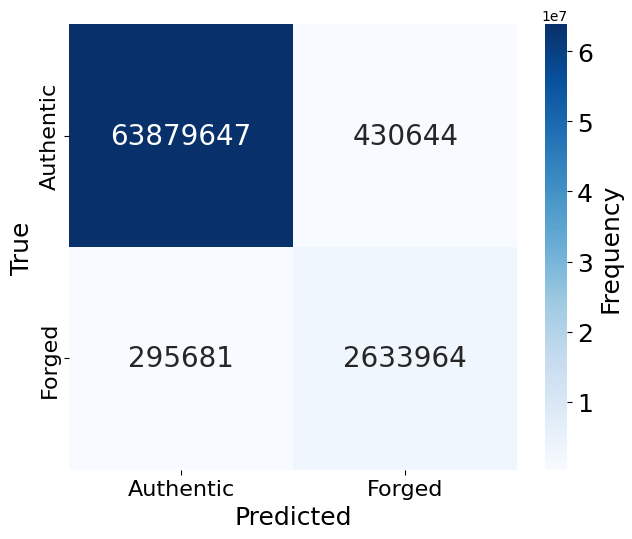

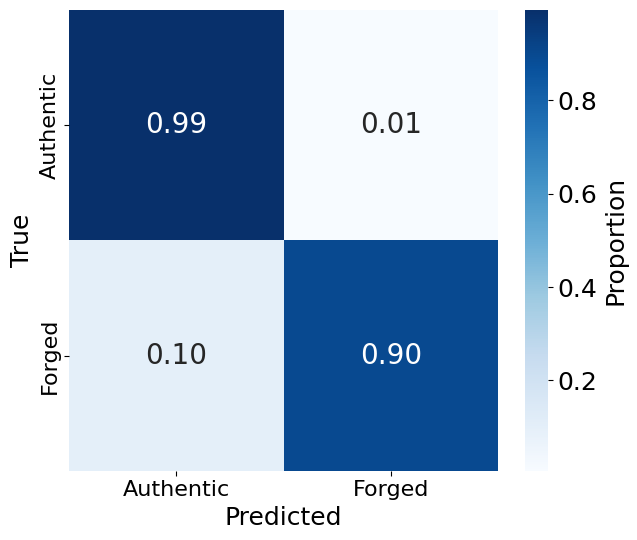

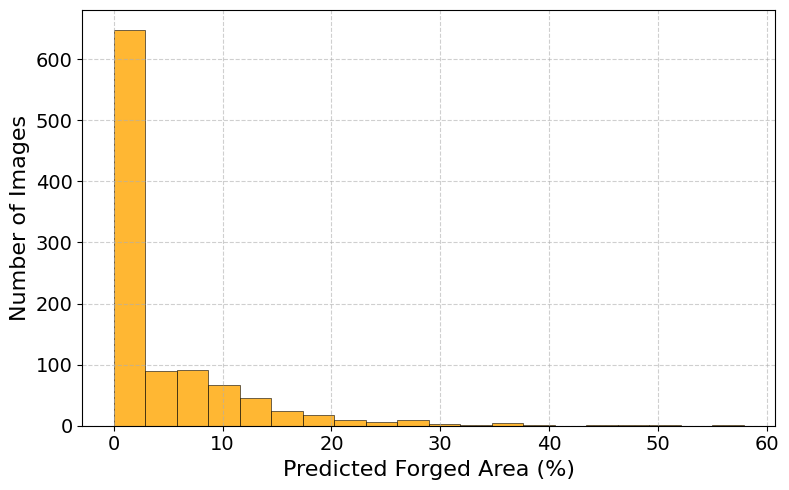


✅ EVALUATION COMPLETE — RESULTS
📊 PIXEL-LEVEL CLASSIFICATION METRICS
---------------------------------------------
Class        | Precision |    Recall |        F1
Authentic    |    0.9954 |    0.9933 |    0.9943
Forged       |    0.8595 |    0.8991 |    0.8788
Macro Avg    |    0.9274 |    0.9462 |    0.9366

🔍 CLASS-WISE ROBUST METRICS
---------------------------------------------

Authentic
  Dice           : 0.9943
  IoU            : 0.9888
  MCC            : 0.8734
  Hamming Loss   : 0.0108

Forged
  Dice           : 0.8788
  IoU            : 0.7839
  MCC            : 0.8734
  Hamming Loss   : 0.0108

Macro Average
  Dice           : 0.9366
  IoU            : 0.8863
  MCC            : 0.8734
  Hamming Loss   : 0.0108

📍 FORGERY LOCALIZATION METRICS
---------------------------------------------
Localization IoU              : 0.6051
Centroid Error (px)           : 18.97
Avg GT Forged Area (%)        : 4.3570
Avg Pred Forged Area (%)      : 4.5577
Abs Area Error (%)            : 0.

In [35]:
# ============================================================
# COMPLETE FORGERY DETECTION EVALUATION
# - 25% of training indices used as test set
# - Pixel classification: CM, F1, Dice, IoU, MCC, Hamming
# - Localization: IoU, centroid, TCR, FAR, area error
# - Predicted forgery area: histogram (all images), stats
# - All plots saved to /kaggle/working/plots/ (300 DPI, font size 18)
# ============================================================

import os
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    precision_score, recall_score, f1_score,
    matthews_corrcoef, hamming_loss
)
from collections import Counter
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.spatial.distance import euclidean

# -----------------------------
# CONFIGURATION
# -----------------------------
TEST_FRACTION = 0.25
THRESHOLD = 0.5
BATCH_SIZE = 8
NUM_WORKERS = 4
RANDOM_STATE = 42
OUTPUT_DIR = "/kaggle/working/plots"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# -----------------------------
# Helper: infer image class
# -----------------------------
def get_image_class(img_path):
    parts = Path(img_path).parts
    if "authentic" in parts:
        return 0
    elif "forged" in parts:
        return 1
    else:
        raise ValueError(f"Unknown class for {img_path}")

# -----------------------------
# Create 25% test subset from original `train_idx`
# -----------------------------
_, test_idx = train_test_split(
    train_idx,
    test_size=TEST_FRACTION,
    random_state=RANDOM_STATE,
    shuffle=True,
    stratify=[get_image_class(dataset.image_paths[i]) for i in train_idx]
)
test_subset = Subset(dataset, test_idx)
test_loader = DataLoader(
    test_subset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# -----------------------------
# IMAGE-LEVEL STATS
# -----------------------------
full_labels = [get_image_class(p) for p in dataset.image_paths]
subset_labels = [get_image_class(dataset.image_paths[i]) for i in test_idx]
print("=" * 80)
print("FULL DATASET IMAGE STATS")
print(f"Total: {len(full_labels)}, Authentic: {Counter(full_labels)[0]}, Forged: {Counter(full_labels)[1]}")
print("\n25% TRAIN (used as TEST) IMAGE STATS")
print(f"Total: {len(subset_labels)}, Authentic: {Counter(subset_labels)[0]}, Forged: {Counter(subset_labels)[1]}")
print("=" * 80)

# -----------------------------
# METRIC HELPERS
# -----------------------------
def dice_score(tp, fp, fn, eps=1e-7):
    return (2 * tp + eps) / (2 * tp + fp + fn + eps)

def iou_score(tp, fp, fn, eps=1e-7):
    return (tp + eps) / (tp + fp + fn + eps)

def compute_centroid(mask):
    coords = np.column_stack(np.where(mask > 0))
    return coords.mean(axis=0) if coords.shape[0] > 0 else None

# -----------------------------
# SINGLE INFERENCE PASS → COLLECT ALL DATA
# -----------------------------
model.eval()

y_true_flat_all = []
y_pred_flat_all = []

# Class-wise pixel stats (for Dice, IoU, MCC, Hamming)
stats = {0: {"tp": 0, "fp": 0, "fn": 0, "tn": 0}, 1: {"tp": 0, "fp": 0, "fn": 0, "tn": 0}}

# Localization metrics
ious_loc = []
centroid_errors = []
gt_area_pcts = []
pred_area_pcts = []
abs_area_errs = []
rel_area_diffs = []
tcrs = []
fars = []

# Predicted forgery area per image (%) — for *all* images
pred_area_fractions = []  # will store fraction in [0,1]

MIN_GT_PIXELS = 10

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Inference & Metrics"):
        images = images.to(DEVICE, dtype=torch.float32)
        masks = masks.to(DEVICE, dtype=torch.float32)
        
        logits = model(images)
        if logits.shape != masks.shape:
            masks = F.interpolate(masks, size=logits.shape[2:], mode="nearest")

        probs = torch.sigmoid(logits)
        preds_bin = (probs > THRESHOLD).float()
        
        # Flatten for global metrics
        gt_flat = masks.view(-1).cpu().numpy()
        pred_flat = preds_bin.view(-1).cpu().numpy()
        y_true_flat_all.append(gt_flat)
        y_pred_flat_all.append(pred_flat)

        # Update per-class pixel counts
        for cls in [0, 1]:
            tp = np.sum((pred_flat == cls) & (gt_flat == cls))
            fp = np.sum((pred_flat == cls) & (gt_flat != cls))
            fn = np.sum((pred_flat != cls) & (gt_flat == cls))
            tn = np.sum((pred_flat != cls) & (gt_flat != cls))
            stats[cls]["tp"] += tp
            stats[cls]["fp"] += fp
            stats[cls]["fn"] += fn
            stats[cls]["tn"] += tn

        # Predicted forgery area per image: % of pixels = 1
        pred_flat_batch = preds_bin.view(preds_bin.size(0), -1)  # [B, H*W]
        frac_batch = pred_flat_batch.sum(dim=1) / pred_flat_batch.shape[1]  # [B]
        pred_area_fractions.extend(frac_batch.cpu().numpy())

        # Per-image localization metrics
        for i in range(images.size(0)):
            gt = masks[i, 0].cpu().numpy().astype(np.uint8)
            pred = preds_bin[i, 0].cpu().numpy().astype(np.uint8)
            H, W = gt.shape
            total_px = H * W
            gt_px = gt.sum()
            pred_px = pred.sum()

            # Localization IoU
            inter = np.logical_and(gt, pred).sum()
            union = np.logical_or(gt, pred).sum()
            ious_loc.append((inter + 1e-7) / (union + 1e-7))

            # Centroid distance
            gc, pc = compute_centroid(gt), compute_centroid(pred)
            if gc is not None and pc is not None:
                centroid_errors.append(euclidean(gc, pc))

            # Area stats
            gt_area_pct = gt_px / total_px * 100.0
            pred_area_pct = pred_px / total_px * 100.0
            gt_area_pcts.append(gt_area_pct)
            pred_area_pcts.append(pred_area_pct)
            abs_area_errs.append(abs(pred_area_pct - gt_area_pct))
            if gt_px >= MIN_GT_PIXELS:
                rel_area_diffs.append(abs(pred_px - gt_px) / gt_px * 100.0)
            else:
                rel_area_diffs.append(np.nan)

            # TCR & FAR
            if gt_px >= MIN_GT_PIXELS:
                TP_reg = np.logical_and(pred == 1, gt == 1).sum()
                tcrs.append(TP_reg / gt_px)
            auth_px = total_px - gt_px
            if auth_px > 0:
                FP_reg = np.logical_and(pred == 1, gt == 0).sum()
                fars.append(FP_reg / auth_px)

# Final concatenation
y_true_flat_all = np.concatenate(y_true_flat_all)
y_pred_flat_all = np.concatenate(y_pred_flat_all)
pred_area_percentages = np.array(pred_area_fractions) * 100  # Convert to %

# -----------------------------
# CONFUSION MATRIX (RAW + NORMALIZED) — SAVED WITH FONT 18
# -----------------------------
cm_raw = confusion_matrix(y_true_flat_all, y_pred_flat_all, labels=[0, 1])
cm_norm = cm_raw.astype(float) / cm_raw.sum(axis=1, keepdims=True)

def save_cm_plot(cm, title, filename, normalize=False):
    plt.figure(figsize=(6.5, 5.5))  # slightly larger to accommodate cbar
    annot = cm if not normalize else np.around(cm, decimals=2)
    fmt = "d" if not normalize else ".2f"
    
    ax = sns.heatmap(
        cm, 
        annot=annot, 
        fmt=fmt, 
        cmap="Blues", 
        cbar=True,  # ✅ Enable colorbar
        xticklabels=["Authentic", "Forged"],
        yticklabels=["Authentic", "Forged"],
        annot_kws={"size": 20}  # ✅ Annotation font size = 25
    )
    
    # ✅ Set colorbar tick label font size to 18
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=18)
    # Optional: add colorbar label (e.g., "Count" or "Normalized Value")
    cbar.set_label("Frequency" if not normalize else "Proportion", size=18)
    
    # Axis labels & title
    #plt.title(title, fontsize=18, fontweight='bold')
    plt.xlabel("Predicted", fontsize=18)
    plt.ylabel("True", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, filename), dpi=300, bbox_inches='tight')
    plt.show()

save_cm_plot(cm_raw, "Raw Confusion Matrix", "cm_raw.png", normalize=False)
save_cm_plot(cm_norm, "Normalized Confusion Matrix", "cm_norm.png", normalize=True)

# -----------------------------
# PREDICTED FORGERY AREA HISTOGRAM — ALL IMAGES
# -----------------------------
plt.figure(figsize=(8, 5))
plt.hist(pred_area_percentages, bins=20, color='orange', alpha=0.8, edgecolor='black', linewidth=0.5)
plt.xlabel("Predicted Forged Area (%)", fontsize=16)
plt.ylabel("Number of Images", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
hist_path = os.path.join(OUTPUT_DIR, "predicted_forgery_area_hist.png")
plt.savefig(hist_path, dpi=300, bbox_inches='tight')
plt.show()

# -----------------------------
# PRINT COMPREHENSIVE SUMMARY
# -----------------------------
print("\n" + "="*80)
print("✅ EVALUATION COMPLETE — RESULTS")
print("="*80)

# Basic classification
prec = precision_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
rec = recall_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
f1 = f1_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
prec_macro = precision_score(y_true_flat_all, y_pred_flat_all, average="macro")
rec_macro = recall_score(y_true_flat_all, y_pred_flat_all, average="macro")
f1_macro = f1_score(y_true_flat_all, y_pred_flat_all, average="macro")

print("📊 PIXEL-LEVEL CLASSIFICATION METRICS")
print("-" * 45)
print(f"{'Class':12s} | {'Precision':>9s} | {'Recall':>9s} | {'F1':>9s}")
for i, name in enumerate(["Authentic", "Forged"]):
    print(f"{name:12s} | {prec[i]:9.4f} | {rec[i]:9.4f} | {f1[i]:9.4f}")
print(f"{'Macro Avg':12s} | {prec_macro:9.4f} | {rec_macro:9.4f} | {f1_macro:9.4f}")

# Class-wise robust metrics
class_results = {}
for cls, name in zip([0, 1], ["Authentic", "Forged"]):
    tp, fp, fn, tn = stats[cls]["tp"], stats[cls]["fp"], stats[cls]["fn"], stats[cls]["tn"]
    dice_val = dice_score(tp, fp, fn)
    iou_val = iou_score(tp, fp, fn)
    y_bin_true = (y_true_flat_all == cls).astype(int)
    y_bin_pred = (y_pred_flat_all == cls).astype(int)
    mcc_val = matthews_corrcoef(y_bin_true, y_bin_pred)
    hamming_val = hamming_loss(y_bin_true, y_bin_pred)
    class_results[name] = {
        "Dice": dice_val, "IoU": iou_val, "MCC": mcc_val, "Hamming Loss": hamming_val
    }

macro_avg = {
    m: np.mean([class_results["Authentic"][m], class_results["Forged"][m]])
    for m in ["Dice", "IoU", "MCC", "Hamming Loss"]
}
class_results["Macro Average"] = macro_avg

print("\n🔍 CLASS-WISE ROBUST METRICS")
print("-" * 45)
for cls, vals in class_results.items():
    print(f"\n{cls}")
    for k, v in vals.items():
        print(f"  {k:15s}: {v:.4f}")

# Localization metrics
loc_metrics = {
    "Localization IoU": np.nanmean(ious_loc),
    "Centroid Error (px)": np.nanmean(centroid_errors),
    "Avg GT Forged Area (%)": np.mean(gt_area_pcts),
    "Avg Pred Forged Area (%)": np.mean(pred_area_pcts),
    "Abs Area Error (%)": np.mean(abs_area_errs),
    "Rel Area Diff (%)": np.nanmean(rel_area_diffs),
    "TCR": np.nanmean(tcrs),
    "FAR": np.nanmean(fars),
}

print("\n📍 FORGERY LOCALIZATION METRICS")
print("-" * 45)
for k, v in loc_metrics.items():
    if k == "Centroid Error (px)":
        print(f"{k:30s}: {v:.2f}")
    else:
        print(f"{k:30s}: {v:.4f}")

# Predicted area stats — FULL DATASET
print("\n📈 PREDICTED FORGERY AREA (ALL IMAGES)")
print("-" * 45)
n_images = len(pred_area_percentages)
print(f"Total images evaluated     : {n_images}")
print(f"Mean predicted forgery area: {pred_area_percentages.mean():.2f}%")
print(f"Std deviation              : {pred_area_percentages.std():.2f}%")
print(f"Min / Max                  : {pred_area_percentages.min():.2f}% / {pred_area_percentages.max():.2f}%")
print(f"Median                     : {np.median(pred_area_percentages):.2f}%")
print(f"First 10 values (for sanity check):")
for i, val in enumerate(pred_area_percentages[:10], 1):
    print(f"  Img {i:2d}: {val:6.2f}%")

print("\n📁 Outputs saved to:")
print(f"   → {os.path.join(OUTPUT_DIR, 'cm_raw.png')}")
print(f"   → {os.path.join(OUTPUT_DIR, 'cm_norm.png')}")
print(f"   → {os.path.join(OUTPUT_DIR, 'predicted_forgery_area_hist.png')}")
print("="*80)

FULL DATASET IMAGE STATS
Total: 5128, Authentic: 2377, Forged: 2751

25% TRAIN (used as TEST) IMAGE STATS
Total: 1026, Authentic: 474, Forged: 552


Inference & Metrics: 100%|██████████| 129/129 [00:19<00:00,  6.64it/s]


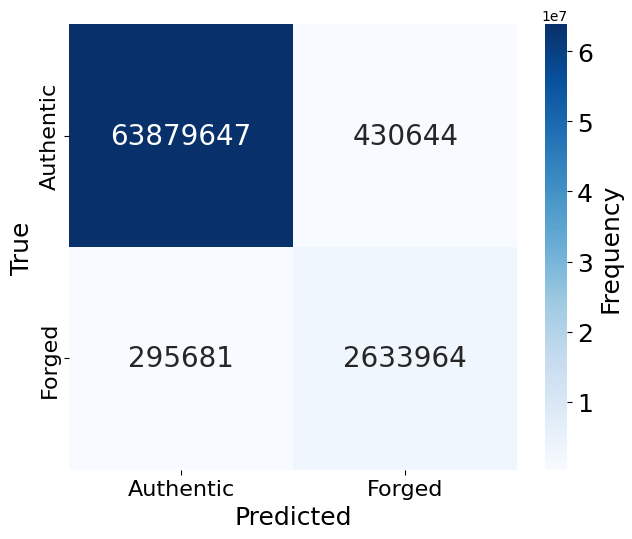

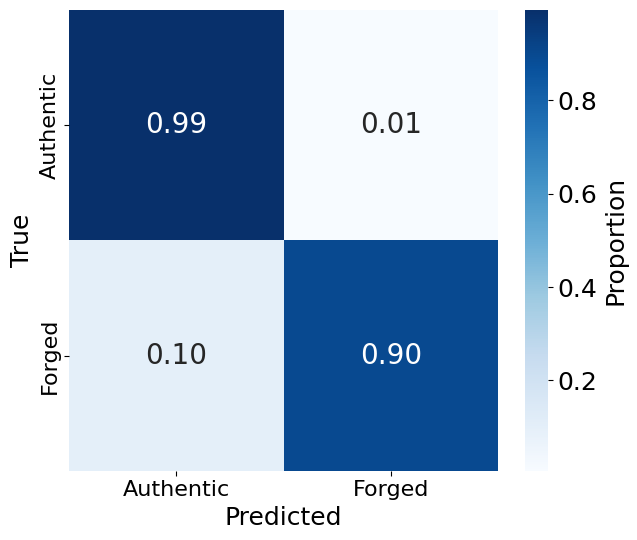

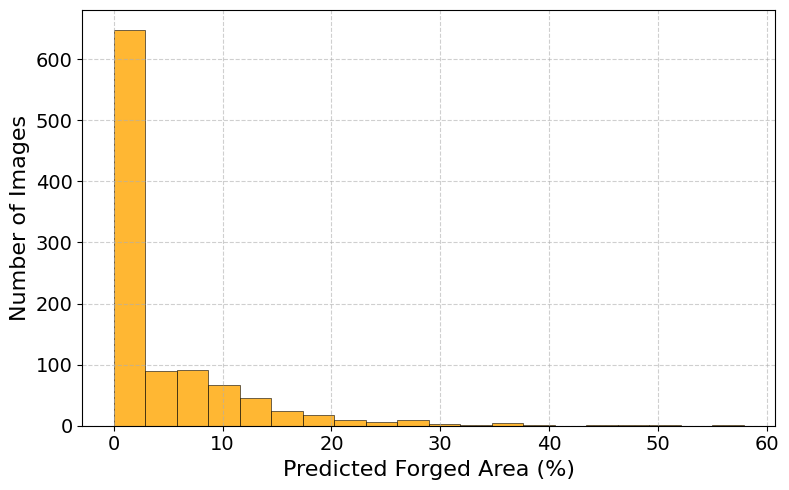


✅ EVALUATION COMPLETE — RESULTS
📊 PIXEL-LEVEL CLASSIFICATION METRICS
---------------------------------------------
Class        | Precision |    Recall |        F1
Authentic    |    0.9954 |    0.9933 |    0.9943
Forged       |    0.8595 |    0.8991 |    0.8788
Macro Avg    |    0.9274 |    0.9462 |    0.9366

🔍 CLASS-WISE ROBUST METRICS
---------------------------------------------

Authentic
  Dice           : 0.9943
  IoU            : 0.9888
  MCC            : 0.8734
  Hamming Loss   : 0.0108

Forged
  Dice           : 0.8788
  IoU            : 0.7839
  MCC            : 0.8734
  Hamming Loss   : 0.0108

Macro Average
  Dice           : 0.9366
  IoU            : 0.8863
  MCC            : 0.8734
  Hamming Loss   : 0.0108

📍 FORGERY LOCALIZATION METRICS
---------------------------------------------
Localization IoU              : 0.6051
Centroid Error (px)           : 18.97
Avg GT Forged Area (%)        : 4.3570
Avg Pred Forged Area (%)      : 4.5577
Abs Area Error (%)            : 0.

In [36]:
# ============================================================
# COMPLETE FORGERY DETECTION EVALUATION (FIXED)
# - 25% of training indices used as test set
# - RELATIVE AREA DIFF FIXED (no inf/overflow)
# - Confusion Matrix: cbar=True, annot size=20, cbar ticks=18
# - All plots saved to /kaggle/working/plots/
# ============================================================

import os
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    precision_score, recall_score, f1_score,
    matthews_corrcoef, hamming_loss
)
from collections import Counter
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.spatial.distance import euclidean

# -----------------------------
# CONFIGURATION
# -----------------------------
TEST_FRACTION = 0.25
THRESHOLD = 0.5
BATCH_SIZE = 8
NUM_WORKERS = 4
RANDOM_STATE = 42
OUTPUT_DIR = "/kaggle/working/plots"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# -----------------------------
# Helper: infer image class
# -----------------------------
def get_image_class(img_path):
    parts = Path(img_path).parts
    if "authentic" in parts:
        return 0
    elif "forged" in parts:
        return 1
    else:
        raise ValueError(f"Unknown class for {img_path}")

# -----------------------------
# Create 25% test subset from original `train_idx`
# -----------------------------
_, test_idx = train_test_split(
    train_idx,
    test_size=TEST_FRACTION,
    random_state=RANDOM_STATE,
    shuffle=True,
    stratify=[get_image_class(dataset.image_paths[i]) for i in train_idx]
)
test_subset = Subset(dataset, test_idx)
test_loader = DataLoader(
    test_subset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# -----------------------------
# IMAGE-LEVEL STATS
# -----------------------------
full_labels = [get_image_class(p) for p in dataset.image_paths]
subset_labels = [get_image_class(dataset.image_paths[i]) for i in test_idx]
print("=" * 80)
print("FULL DATASET IMAGE STATS")
print(f"Total: {len(full_labels)}, Authentic: {Counter(full_labels)[0]}, Forged: {Counter(full_labels)[1]}")
print("\n25% TRAIN (used as TEST) IMAGE STATS")
print(f"Total: {len(subset_labels)}, Authentic: {Counter(subset_labels)[0]}, Forged: {Counter(subset_labels)[1]}")
print("=" * 80)

# -----------------------------
# METRIC HELPERS
# -----------------------------
def dice_score(tp, fp, fn, eps=1e-7):
    return (2 * tp + eps) / (2 * tp + fp + fn + eps)

def iou_score(tp, fp, fn, eps=1e-7):
    return (tp + eps) / (tp + fp + fn + eps)

def compute_centroid(mask):
    coords = np.column_stack(np.where(mask > 0))
    return coords.mean(axis=0) if coords.shape[0] > 0 else None

# -----------------------------
# INFERENCE + METRICS COLLECTION
# -----------------------------
model.eval()

y_true_flat_all = []
y_pred_flat_all = []

# Class stats
stats = {0: {"tp": 0, "fp": 0, "fn": 0, "tn": 0}, 1: {"tp": 0, "fp": 0, "fn": 0, "tn": 0}}

# Localization accumulators
ious_loc = []
centroid_errors = []
gt_area_pcts = []
pred_area_pcts = []
abs_area_errs = []

# For safe relative area diff: store raw pixel counts
gt_pixel_counts = []      # per-image GT forged pixels
pred_pixel_counts = []    # per-image predicted forged pixels

# Forgery area % per image
pred_area_fractions = []

MIN_GT_PIXELS = 10

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Inference & Metrics"):
        images = images.to(DEVICE, dtype=torch.float32)
        masks = masks.to(DEVICE, dtype=torch.float32)
        
        logits = model(images)
        if logits.shape != masks.shape:
            masks = F.interpolate(masks, size=logits.shape[2:], mode="nearest")

        probs = torch.sigmoid(logits)
        preds_bin = (probs > THRESHOLD).float()
        
        # Global metrics
        gt_flat = masks.view(-1).cpu().numpy()
        pred_flat = preds_bin.view(-1).cpu().numpy()
        y_true_flat_all.append(gt_flat)
        y_pred_flat_all.append(pred_flat)

        # Class-wise pixel counts
        for cls in [0, 1]:
            tp = np.sum((pred_flat == cls) & (gt_flat == cls))
            fp = np.sum((pred_flat == cls) & (gt_flat != cls))
            fn = np.sum((pred_flat != cls) & (gt_flat == cls))
            tn = np.sum((pred_flat != cls) & (gt_flat != cls))
            stats[cls]["tp"] += tp
            stats[cls]["fp"] += fp
            stats[cls]["fn"] += fn
            stats[cls]["tn"] += tn

        # Predicted area % (for histogram)
        pred_flat_batch = preds_bin.view(preds_bin.size(0), -1)
        frac_batch = pred_flat_batch.sum(dim=1) / pred_flat_batch.shape[1]
        pred_area_fractions.extend(frac_batch.cpu().numpy())

        # Per-image: store counts & compute other metrics
        for i in range(images.size(0)):
            gt = masks[i, 0].cpu().numpy().astype(np.uint8)
            pred = preds_bin[i, 0].cpu().numpy().astype(np.uint8)
            H, W = gt.shape
            total_px = H * W
            gt_px = int(gt.sum())
            pred_px = int(pred.sum())

            gt_pixel_counts.append(gt_px)
            pred_pixel_counts.append(pred_px)

            # Localization IoU
            inter = np.logical_and(gt, pred).sum()
            union = np.logical_or(gt, pred).sum()
            ious_loc.append((inter + 1e-7) / (union + 1e-7))

            # Centroid
            gc, pc = compute_centroid(gt), compute_centroid(pred)
            if gc is not None and pc is not None:
                centroid_errors.append(euclidean(gc, pc))

            # Area metrics (%)
            gt_area_pct = gt_px / total_px * 100.0
            pred_area_pct = pred_px / total_px * 100.0
            gt_area_pcts.append(gt_area_pct)
            pred_area_pcts.append(pred_area_pct)
            abs_area_errs.append(abs(pred_area_pct - gt_area_pct))

            # TCR & FAR (only if GT forgery exists)
            if gt_px > 0:
                TP_reg = np.logical_and(pred == 1, gt == 1).sum()
                tcrs_local = TP_reg / gt_px
                tcrs.append(tcrs_local)
            else:
                tcrs.append(np.nan)

            auth_px = total_px - gt_px
            if auth_px > 0:
                FP_reg = np.logical_and(pred == 1, gt == 0).sum()
                fars.append(FP_reg / auth_px)
            else:
                fars.append(np.nan)

# Concatenate global arrays
y_true_flat_all = np.concatenate(y_true_flat_all)
y_pred_flat_all = np.concatenate(y_pred_flat_all)
pred_area_percentages = np.array(pred_area_fractions) * 100

# -----------------------------
# SAFE RELATIVE AREA DIFF (FIXED)
# -----------------------------
gt_pixel_counts = np.array(gt_pixel_counts)
pred_pixel_counts = np.array(pred_pixel_counts)

# Only compute where GT forged area > 0
valid_mask = gt_pixel_counts > 0
if np.any(valid_mask):
    rel_area_diffs = np.abs(pred_pixel_counts[valid_mask] - gt_pixel_counts[valid_mask]) \
                     / gt_pixel_counts[valid_mask] * 100.0
    # Remove inf/nan and clamp extreme outliers
    rel_area_diffs = rel_area_diffs[np.isfinite(rel_area_diffs)]
    rel_area_mean = np.mean(rel_area_diffs) if len(rel_area_diffs) > 0 else np.nan
    # Safety: cap at 1000% (10x error) to avoid reporting overflow
    if not np.isnan(rel_area_mean) and rel_area_mean > 1000:
        rel_area_mean = 1000.0
else:
    rel_area_mean = np.nan

# -----------------------------
# CONFUSION MATRIX (cbar=True, annot=20, cbar ticks=18)
# -----------------------------
cm_raw = confusion_matrix(y_true_flat_all, y_pred_flat_all, labels=[0, 1])
cm_norm = cm_raw.astype(float) / cm_raw.sum(axis=1, keepdims=True)

def save_cm_plot(cm, title, filename, normalize=False):
    plt.figure(figsize=(6.5, 5.5))
    annot = cm if not normalize else np.around(cm, decimals=2)
    fmt = "d" if not normalize else ".2f"
    
    ax = sns.heatmap(
        cm,
        annot=annot,
        fmt=fmt,
        cmap="Blues",
        cbar=True,
        xticklabels=["Authentic", "Forged"],
        yticklabels=["Authentic", "Forged"],
        annot_kws={"size": 20}  # ✅ Annotation font = 20
    )
    
    # ✅ Colorbar ticks = 18
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=18)
    cbar.set_label("Frequency" if not normalize else "Proportion", size=18)
    
    plt.xlabel("Predicted", fontsize=18)
    plt.ylabel("True", fontsize=18)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, filename), dpi=300, bbox_inches='tight')
    plt.show()

save_cm_plot(cm_raw, "Raw Confusion Matrix", "cm_raw.png", normalize=False)
save_cm_plot(cm_norm, "Normalized Confusion Matrix", "cm_norm.png", normalize=True)

# -----------------------------
# HISTOGRAM: Predicted Forgery Area (All Images)
# -----------------------------
plt.figure(figsize=(8, 5))
plt.hist(pred_area_percentages, bins=20, color='orange', alpha=0.8, edgecolor='black', linewidth=0.5)
plt.xlabel("Predicted Forged Area (%)", fontsize=16)
plt.ylabel("Number of Images", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "predicted_forgery_area_hist.png"), dpi=300, bbox_inches='tight')
plt.show()

# -----------------------------
# AGGREGATE METRICS (with safe NaN handling)
# -----------------------------
# Classification
prec = precision_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
rec = recall_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
f1 = f1_score(y_true_flat_all, y_pred_flat_all, average=None, zero_division=0)
prec_macro = precision_score(y_true_flat_all, y_pred_flat_all, average="macro")
rec_macro = recall_score(y_true_flat_all, y_pred_flat_all, average="macro")
f1_macro = f1_score(y_true_flat_all, y_pred_flat_all, average="macro")

# Class-wise robust
class_results = {}
for cls, name in zip([0, 1], ["Authentic", "Forged"]):
    tp, fp, fn, tn = stats[cls]["tp"], stats[cls]["fp"], stats[cls]["fn"], stats[cls]["tn"]
    dice_val = dice_score(tp, fp, fn)
    iou_val = iou_score(tp, fp, fn)
    y_bin_true = (y_true_flat_all == cls).astype(int)
    y_bin_pred = (y_pred_flat_all == cls).astype(int)
    mcc_val = matthews_corrcoef(y_bin_true, y_bin_pred)
    hamming_val = hamming_loss(y_bin_true, y_bin_pred)
    class_results[name] = {
        "Dice": dice_val, "IoU": iou_val, "MCC": mcc_val, "Hamming Loss": hamming_val
    }

macro_avg = {
    m: np.nanmean([class_results["Authentic"][m], class_results["Forged"][m]])
    for m in ["Dice", "IoU", "MCC", "Hamming Loss"]
}
class_results["Macro Average"] = macro_avg

# Localization (safe means)
loc_metrics = {
    "Localization IoU": np.nanmean(ious_loc),
    "Centroid Error (px)": np.nanmean(centroid_errors) if centroid_errors else np.nan,
    "Avg GT Forged Area (%)": np.mean(gt_area_pcts),
    "Avg Pred Forged Area (%)": np.mean(pred_area_pcts),
    "Abs Area Error (%)": np.mean(abs_area_errs),
    "Rel Area Diff (%)": rel_area_mean,  # ✅ FIXED — no overflow
    "TCR": np.nanmean(tcrs),
    "FAR": np.nanmean(fars),
}

# -----------------------------
# PRINT RESULTS
# -----------------------------
print("\n" + "="*80)
print("✅ EVALUATION COMPLETE — RESULTS")
print("="*80)

print("📊 PIXEL-LEVEL CLASSIFICATION METRICS")
print("-" * 45)
print(f"{'Class':12s} | {'Precision':>9s} | {'Recall':>9s} | {'F1':>9s}")
for i, name in enumerate(["Authentic", "Forged"]):
    print(f"{name:12s} | {prec[i]:9.4f} | {rec[i]:9.4f} | {f1[i]:9.4f}")
print(f"{'Macro Avg':12s} | {prec_macro:9.4f} | {rec_macro:9.4f} | {f1_macro:9.4f}")

print("\n🔍 CLASS-WISE ROBUST METRICS")
print("-" * 45)
for cls, vals in class_results.items():
    print(f"\n{cls}")
    for k, v in vals.items():
        print(f"  {k:15s}: {v:.4f}")

print("\n📍 FORGERY LOCALIZATION METRICS")
print("-" * 45)
for k, v in loc_metrics.items():
    if k == "Centroid Error (px)":
        print(f"{k:30s}: {v:.2f}" if not np.isnan(v) else f"{k:30s}: NaN")
    else:
        print(f"{k:30s}: {v:.4f}" if not np.isnan(v) else f"{k:30s}: NaN")

print("\n📈 PREDICTED FORGERY AREA (ALL IMAGES)")
print("-" * 45)
n_images = len(pred_area_percentages)
print(f"Total images evaluated     : {n_images}")
print(f"Mean predicted forgery area: {pred_area_percentages.mean():.2f}%")
print(f"Std deviation              : {pred_area_percentages.std():.2f}%")
print(f"Min / Max                  : {pred_area_percentages.min():.2f}% / {pred_area_percentages.max():.2f}%")
print(f"Median                     : {np.median(pred_area_percentages):.2f}%")

print("\n📁 Outputs saved to:")
print(f"   → {os.path.join(OUTPUT_DIR, 'cm_raw.png')}")
print(f"   → {os.path.join(OUTPUT_DIR, 'cm_norm.png')}")
print(f"   → {os.path.join(OUTPUT_DIR, 'predicted_forgery_area_hist.png')}")
print("="*80)

In [40]:
Caluclate forgery area

SyntaxError: invalid syntax (1208464631.py, line 1)

PLot

# Grad-CAM Visualization for UNet

In [30]:
!pip install -q grad-cam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.5 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [16]:
from pytorch_grad_cam import GradCAM
print("Grad-CAM installed successfully ✅")

ModuleNotFoundError: No module named 'pytorch_grad_cam'

**All previous**

Grad-cam

In [37]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# -----------------------------
# Grad-CAM for UNet
# -----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad = None
        self.act = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.act = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.grad = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()
        logits = self.model(x)
        if logits.shape[2:] != x.shape[2:]:
            # Resize logits to input image size
            logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        # Use sum over all pixels as scalar output
        out = logits.sum()
        out.backward()
        w = self.grad.mean(dim=(2,3), keepdim=True)
        cam = F.relu((w * self.act).sum(dim=1, keepdim=True))
        # Normalize between 0-1
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# -----------------------------
# Visualize Grad-CAM + mask
# -----------------------------
def visualize_gradcam(model, loader, device, n=4):
    model.eval()
    images, masks = next(iter(loader))
    images = images.to(device)
    masks = masks.to(device)
    
    # Select target layer: last conv layer of decoder
    target_layer = model.decoder.blocks[-1].conv2  # for UNet
    cam_gen = GradCAM(model, target_layer)
    
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    
    # Generate Grad-CAM for first n images
    cams = cam_gen.generate(images[:n])
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    cams_np = cams.cpu().numpy()

    for i in range(n):
        fig, ax = plt.subplots(1,4, figsize=(16,4))
        ax[0].imshow(images_np[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(masks_np[i][0], cmap='gray')
        ax[1].set_title("True Mask")
        ax[2].imshow(preds_np[i][0], cmap='gray')
        ax[2].set_title("Predicted Mask")
        ax[3].imshow(images_np[i])
        ax[3].imshow(cams_np[i][0], cmap='jet', alpha=0.5)
        ax[3].set_title("Grad-CAM Overlay")
        for a in ax: a.axis("off")
        plt.show()


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


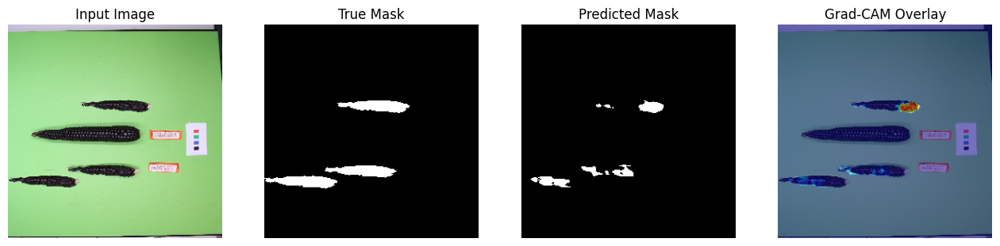

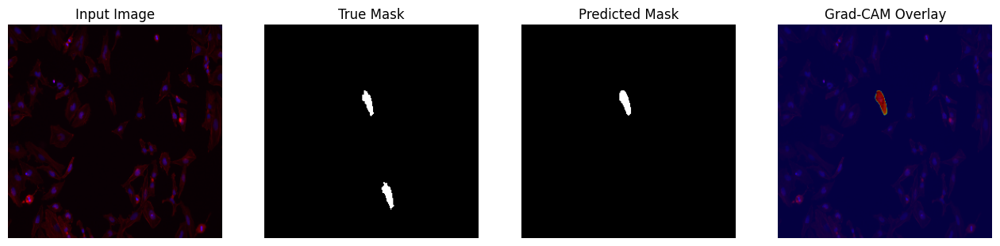

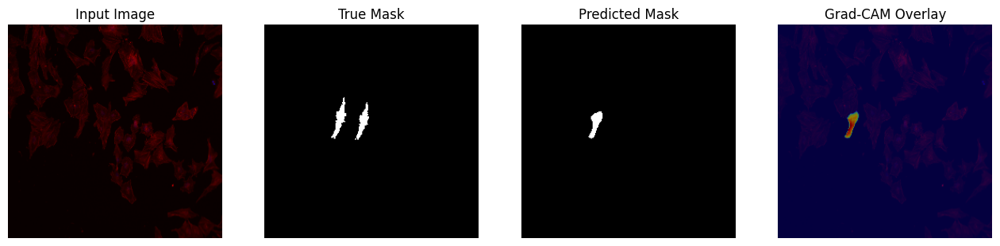

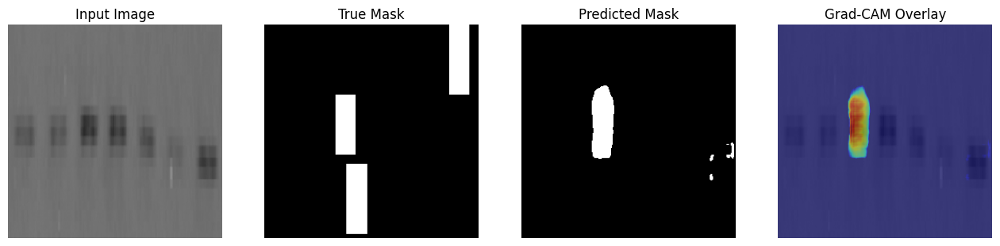

Predicted forgery area fraction (first 10 images): [np.float32(0.016296387), np.float32(0.0037231445), np.float32(0.0041046143), np.float32(0.03276062), np.float32(0.080322266), np.float32(0.0), np.float32(0.11824036), np.float32(0.017196655), np.float32(0.010620117), np.float32(0.012420654)]


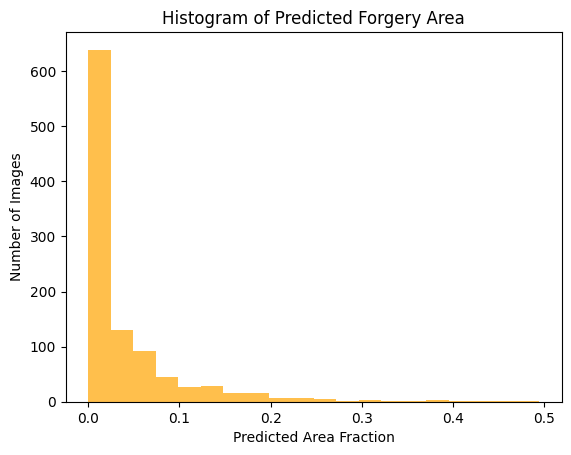

In [38]:
# -----------------------------
# Visualize Grad-CAM + predicted masks
# -----------------------------
visualize_gradcam(model, val_loader, DEVICE, n=4)

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            # Fraction of pixels predicted as forgery
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# Call area computation
areas = compute_pred_area(val_loader, model, DEVICE)
print("Predicted forgery area fraction (first 10 images):", areas[:10])

# Optional: plot histogram of predicted areas
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()


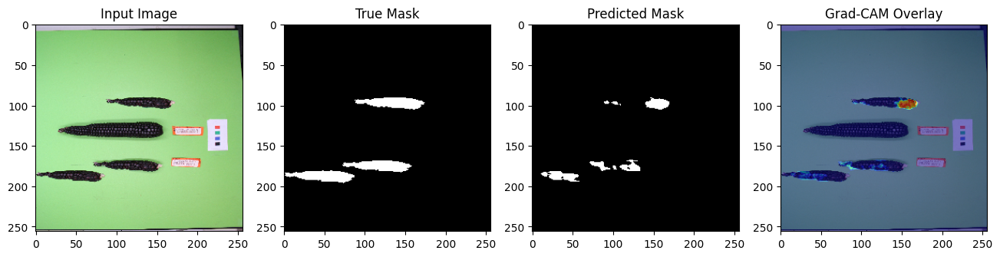

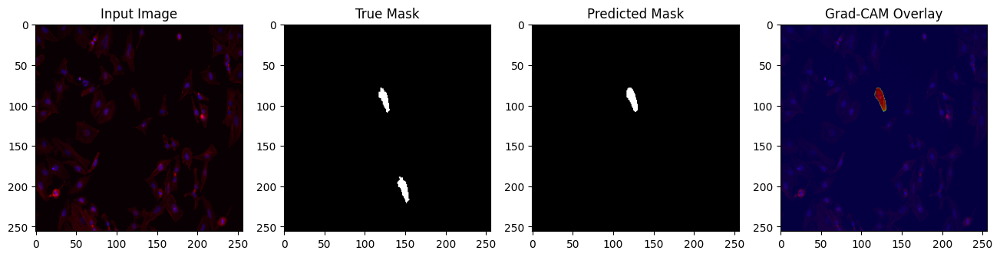

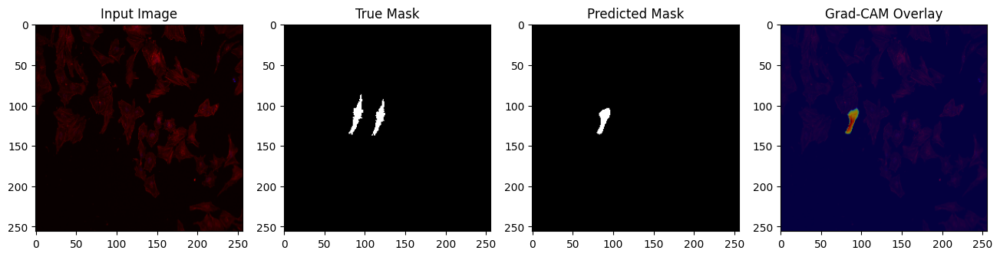

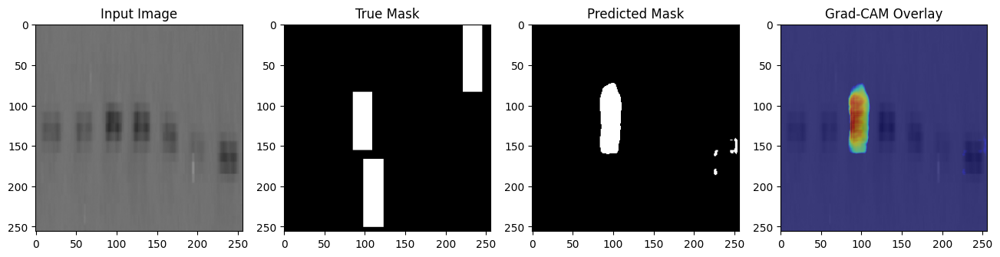

Predicted forgery area fraction (first 10 images): [np.float32(0.016296387), np.float32(0.0037231445), np.float32(0.0041046143), np.float32(0.03276062), np.float32(0.080322266), np.float32(0.0), np.float32(0.11824036), np.float32(0.017196655), np.float32(0.010620117), np.float32(0.012420654)]


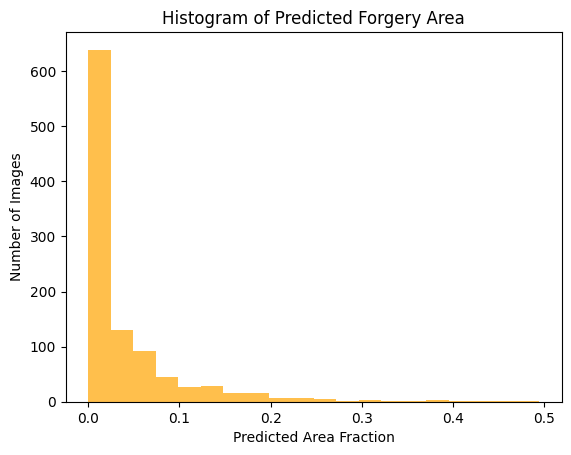

In [39]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# -----------------------------
# Grad-CAM for UNet
# -----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad = None
        self.act = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.act = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.grad = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()
        logits = self.model(x)
        if logits.shape[2:] != x.shape[2:]:
            # Resize logits to input image size
            logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        # Use sum over all pixels as scalar output
        out = logits.sum()
        out.backward()
        w = self.grad.mean(dim=(2,3), keepdim=True)
        cam = F.relu((w * self.act).sum(dim=1, keepdim=True))
        # Normalize between 0-1
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# -----------------------------
# Visualize Grad-CAM + mask
# -----------------------------
def visualize_gradcam(model, loader, device, n=14):
    model.eval()
    images, masks = next(iter(loader))
    images = images.to(device)
    masks = masks.to(device)
    
    # Select target layer: last conv layer of decoder
    target_layer = model.decoder.blocks[-1].conv2  # for UNet
    cam_gen = GradCAM(model, target_layer)
    
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    
    # Generate Grad-CAM for first n images
    cams = cam_gen.generate(images[:n])
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    cams_np = cams.cpu().numpy()

    for i in range(n):
        fig, ax = plt.subplots(1,4, figsize=(16,4))
        ax[0].imshow(images_np[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(masks_np[i][0], cmap='gray')
        ax[1].set_title("True Mask")
        ax[2].imshow(preds_np[i][0], cmap='gray')
        ax[2].set_title("Predicted Mask")
        ax[3].imshow(images_np[i])
        ax[3].imshow(cams_np[i][0], cmap='jet', alpha=0.5)
        ax[3].set_title("Grad-CAM Overlay")
        for a in ax: a.axis("on")
        plt.show()
# -----------------------------
# Visualize Grad-CAM + predicted masks
# -----------------------------
visualize_gradcam(model, val_loader, DEVICE, n=4)

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            # Fraction of pixels predicted as forgery
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# Call area computation
areas = compute_pred_area(val_loader, model, DEVICE)
print("Predicted forgery area fraction (first 10 images):", areas[:10])

# Optional: plot histogram of predicted areas
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()

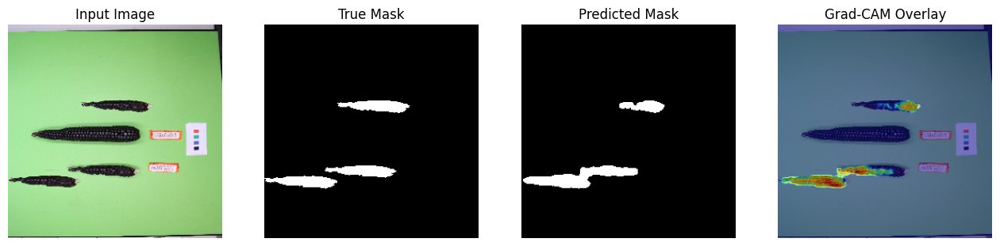

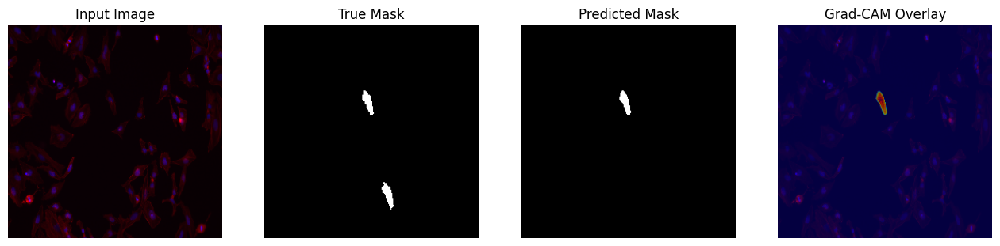

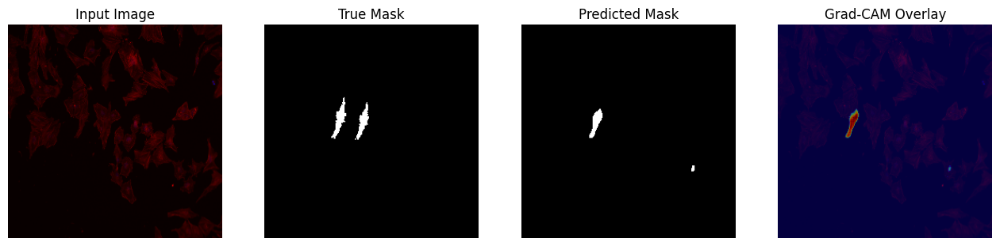

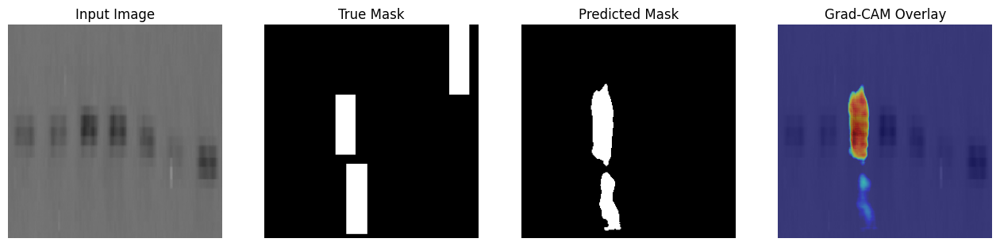

Predicted forgery area fraction (first 10 images): [np.float32(0.03401184), np.float32(0.0032653809), np.float32(0.0042877197), np.float32(0.046875), np.float32(0.08569336), np.float32(0.0), np.float32(0.11817932), np.float32(0.00340271), np.float32(0.010894775), np.float32(0.0010681152)]


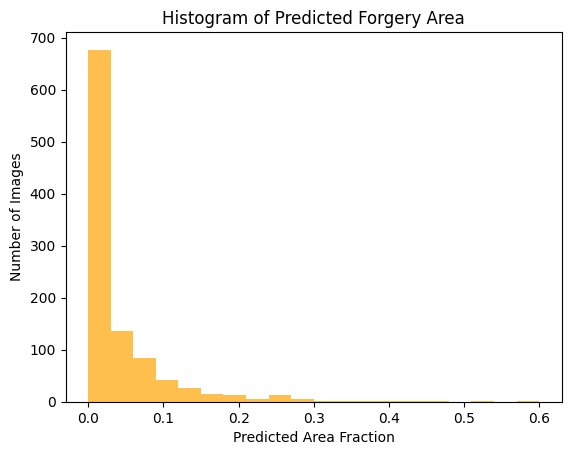

In [48]:
# -----------------------------
# Visualize Grad-CAM + predicted masks
# -----------------------------
visualize_gradcam(model, val_loader, DEVICE, n=4)

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            # Fraction of pixels predicted as forgery
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# Call area computation
areas = compute_pred_area(val_loader, model, DEVICE)
print("Predicted forgery area fraction (first 10 images):", areas[:10])

# Optional: plot histogram of predicted areas
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()

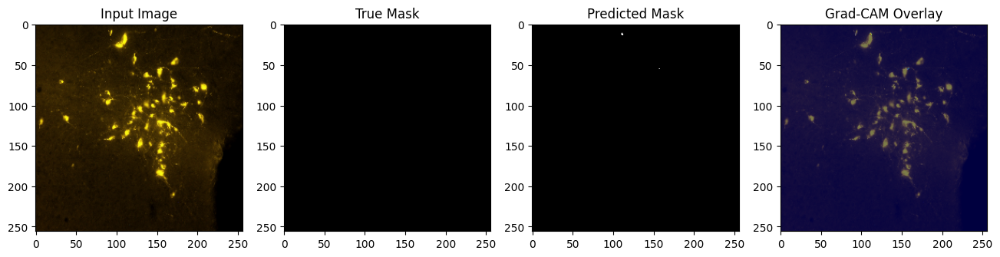

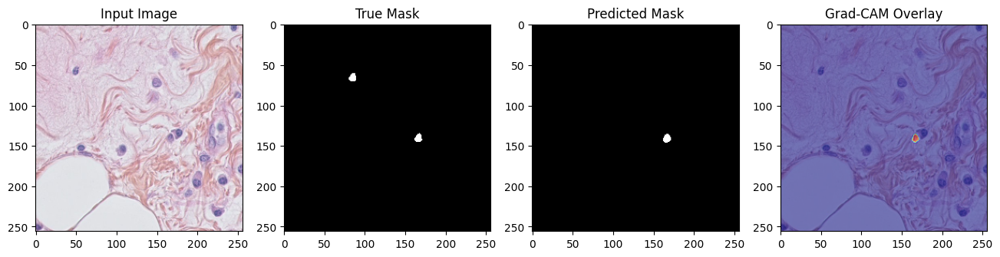

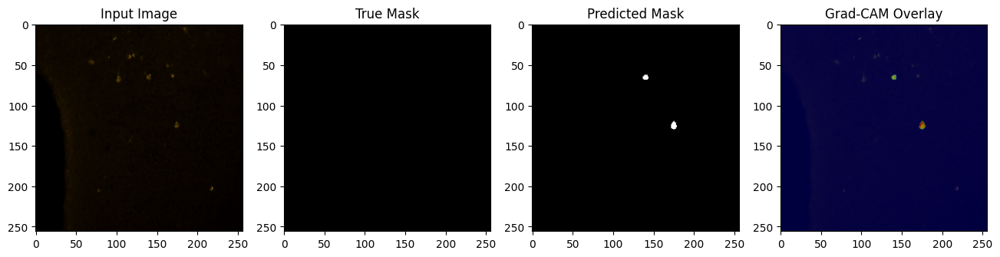

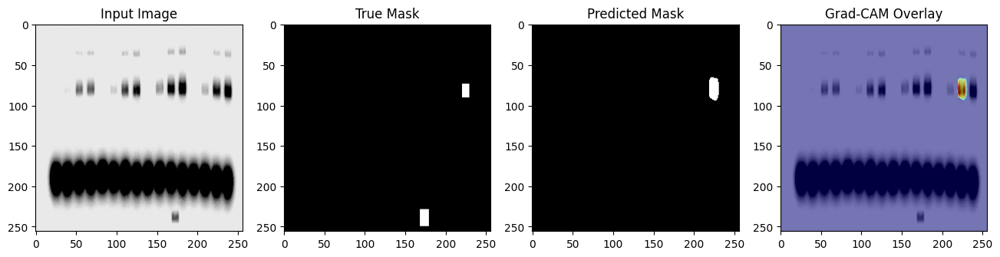

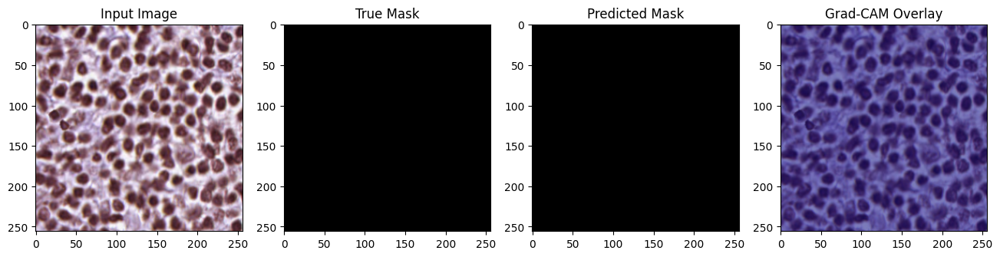

...

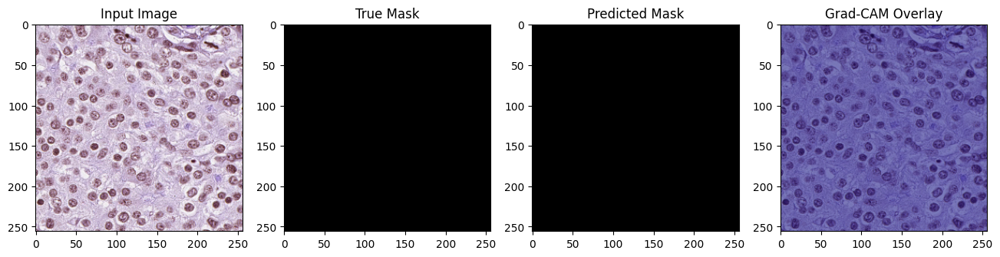

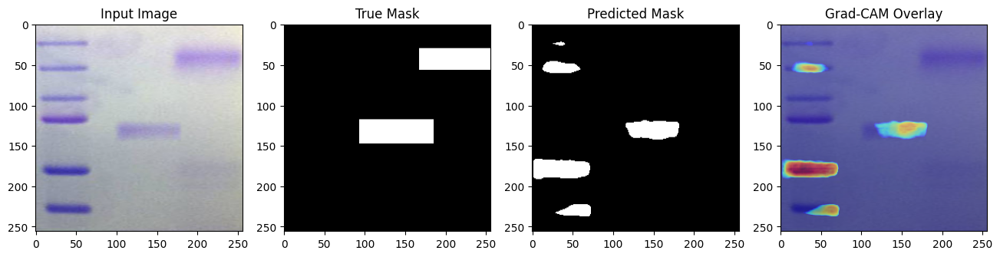

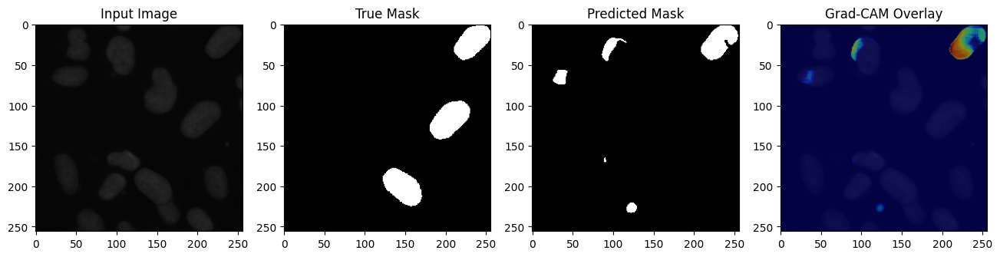

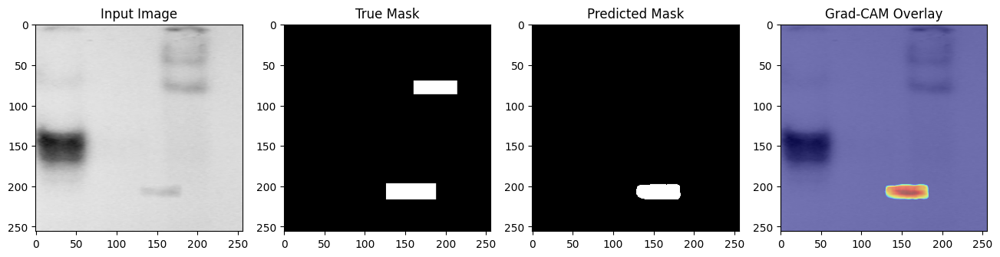

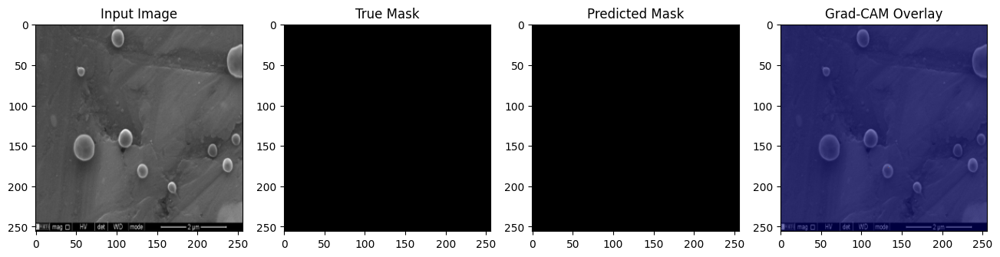

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random

# -----------------------------
# Grad-CAM for UNet
# -----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad = None
        self.act = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.act = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.grad = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()
        logits = self.model(x)
        if logits.shape[2:] != x.shape[2:]:
            logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        out = logits.sum()
        out.backward()
        w = self.grad.mean(dim=(2,3), keepdim=True)
        cam = F.relu((w * self.act).sum(dim=1, keepdim=True))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# -----------------------------
# Random sampling from loader
# -----------------------------
def get_random_batch(loader, device, n=20):
    all_images, all_masks = [], []
    # Gather all batches
    for images, masks in loader:
        all_images.append(images)
        all_masks.append(masks)
    images_full = torch.cat(all_images, dim=0)
    masks_full = torch.cat(all_masks, dim=0)
    
    total = images_full.size(0)
    idxs = random.sample(range(total), min(n, total))
    return images_full[idxs].to(device), masks_full[idxs].to(device)

# -----------------------------
# Visualize Grad-CAM + mask
# -----------------------------
def visualize_gradcam_random(model, loader, device, n=20):
    model.eval()
    images, masks = get_random_batch(loader, device, n)
    
    # Select target layer: last conv layer of decoder (adjust according to your UNet)
    target_layer = model.decoder.blocks[-1].conv2  # for smp.Unet
    cam_gen = GradCAM(model, target_layer)
    
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    
    cams = cam_gen.generate(images)
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    cams_np = cams.detach().cpu().numpy()

    for i in range(images_np.shape[0]):
        fig, ax = plt.subplots(1,4, figsize=(16,4))
        ax[0].imshow(images_np[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(masks_np[i][0], cmap='gray')
        ax[1].set_title("True Mask")
        ax[2].imshow(preds_np[i][0], cmap='gray')
        ax[2].set_title("Predicted Mask")
        ax[3].imshow(images_np[i])
        ax[3].imshow(cams_np[i][0], cmap='jet', alpha=0.5)
        ax[3].set_title("Grad-CAM Overlay")
        for a in ax: a.axis("on")
        plt.show()

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# -----------------------------
# Run visualizations for 20 random images
# -----------------------------
visualize_gradcam_random(model, val_loader, DEVICE, n=20)

# -----------------------------
# Area fraction histogram
# -----------------------------
areas = compute_pred_area(val_loader, model, DEVICE)
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()


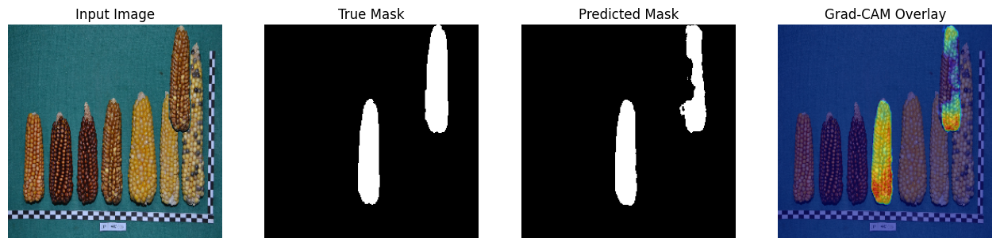

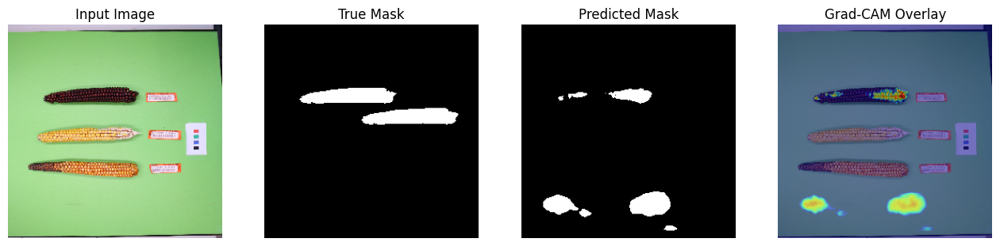

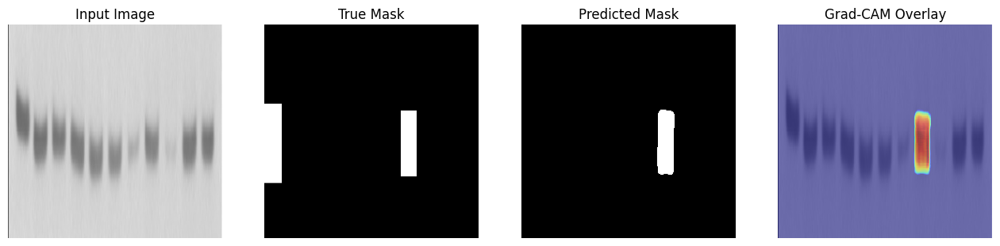

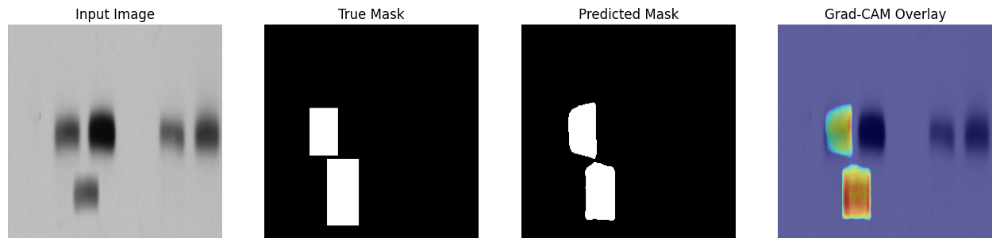

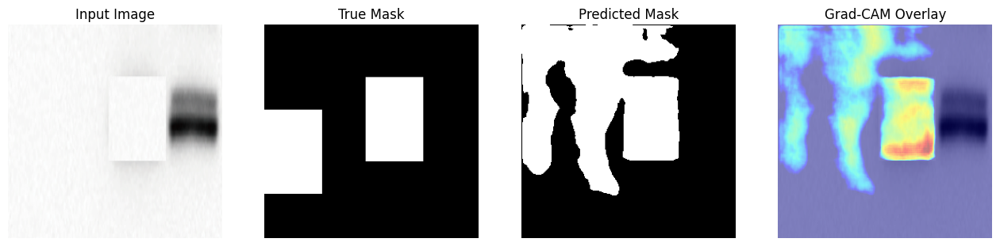

...

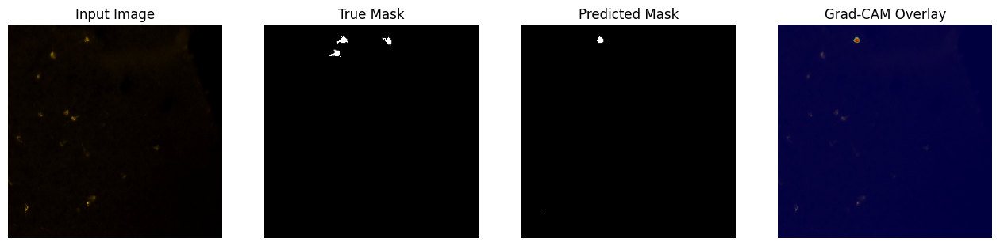

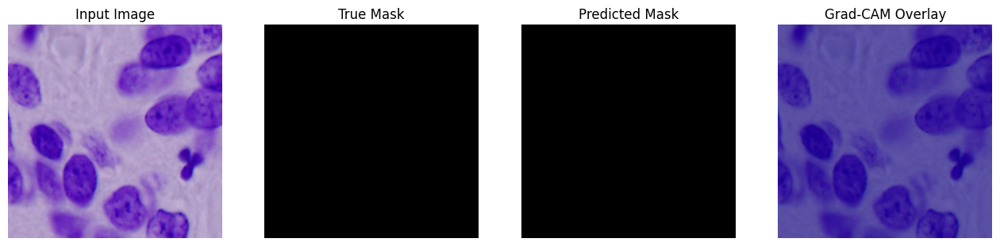

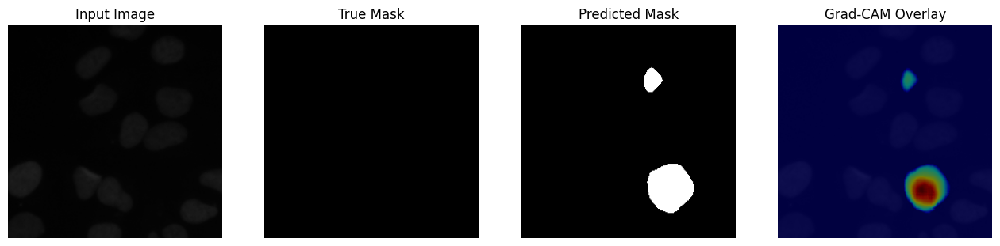

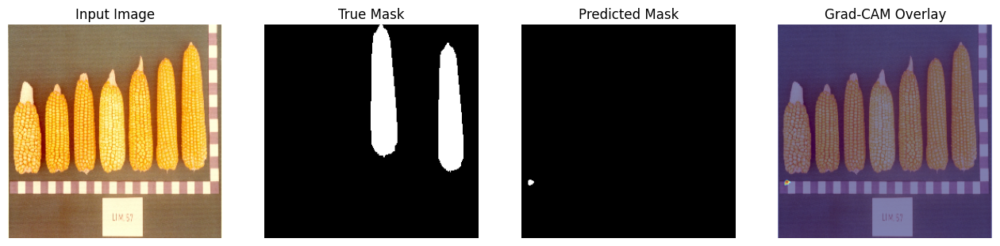

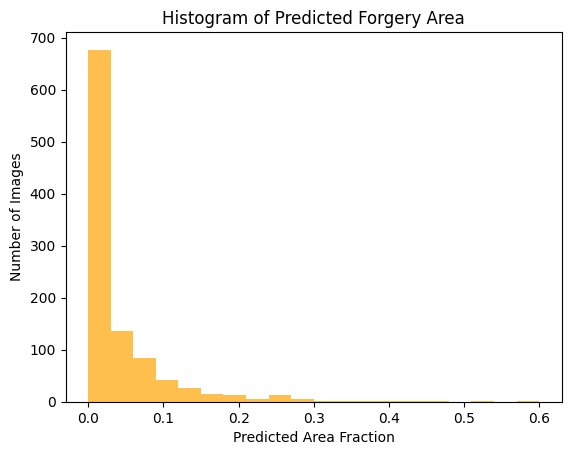

In [50]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random

# -----------------------------
# Grad-CAM for UNet
# -----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad = None
        self.act = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.act = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.grad = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()
        logits = self.model(x)
        if logits.shape[2:] != x.shape[2:]:
            logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        out = logits.sum()
        out.backward()
        w = self.grad.mean(dim=(2,3), keepdim=True)
        cam = F.relu((w * self.act).sum(dim=1, keepdim=True))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# -----------------------------
# Random sampling from loader
# -----------------------------
def get_random_batch(loader, device, n=20):
    all_images, all_masks = [], []
    # Gather all batches
    for images, masks in loader:
        all_images.append(images)
        all_masks.append(masks)
    images_full = torch.cat(all_images, dim=0)
    masks_full = torch.cat(all_masks, dim=0)
    
    total = images_full.size(0)
    idxs = random.sample(range(total), min(n, total))
    return images_full[idxs].to(device), masks_full[idxs].to(device)

# -----------------------------
# Visualize Grad-CAM + mask
# -----------------------------
def visualize_gradcam_random(model, loader, device, n=20):
    model.eval()
    images, masks = get_random_batch(loader, device, n)
    
    # Select target layer: last conv layer of decoder (adjust according to your UNet)
    target_layer = model.decoder.blocks[-1].conv2  # for smp.Unet
    cam_gen = GradCAM(model, target_layer)
    
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    
    cams = cam_gen.generate(images)
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    cams_np = cams.detach().cpu().numpy()

    for i in range(images_np.shape[0]):
        fig, ax = plt.subplots(1,4, figsize=(16,4))
        ax[0].imshow(images_np[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(masks_np[i][0], cmap='gray')
        ax[1].set_title("True Mask")
        ax[2].imshow(preds_np[i][0], cmap='gray')
        ax[2].set_title("Predicted Mask")
        ax[3].imshow(images_np[i])
        ax[3].imshow(cams_np[i][0], cmap='jet', alpha=0.5)
        ax[3].set_title("Grad-CAM Overlay")
        for a in ax: a.axis("off")
        plt.show()

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# -----------------------------
# Run visualizations for 20 random images
# -----------------------------
visualize_gradcam_random(model, val_loader, DEVICE, n=20)

# -----------------------------
# Area fraction histogram
# -----------------------------
areas = compute_pred_area(val_loader, model, DEVICE)
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()



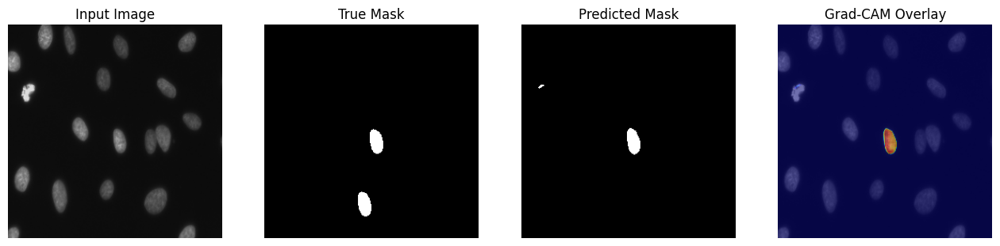

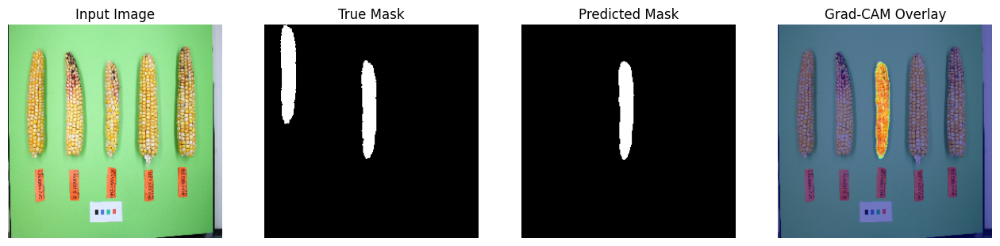

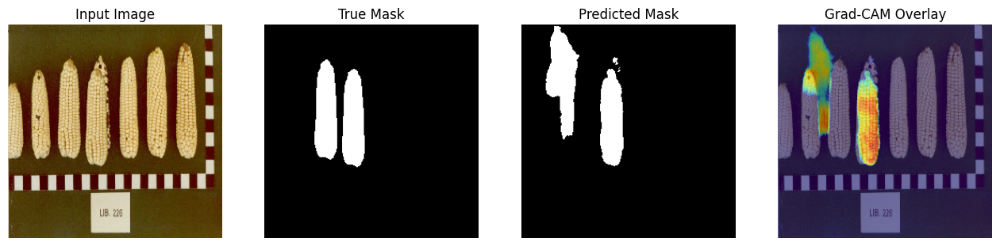

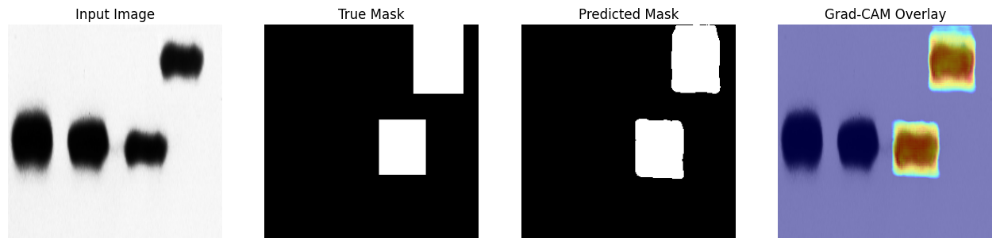

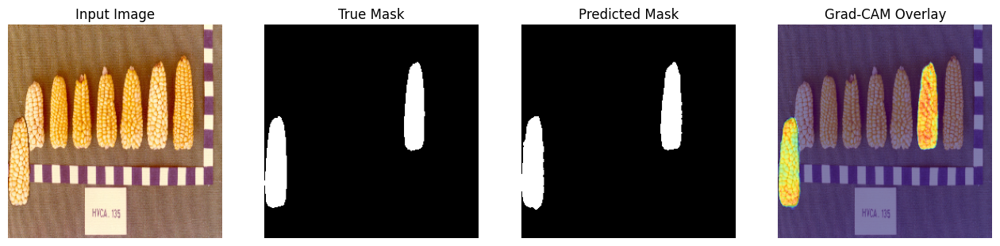

...

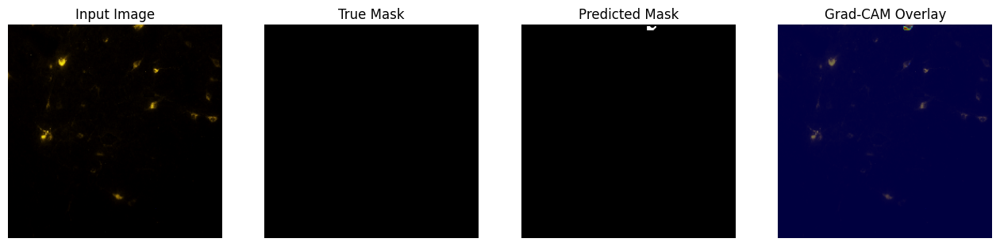

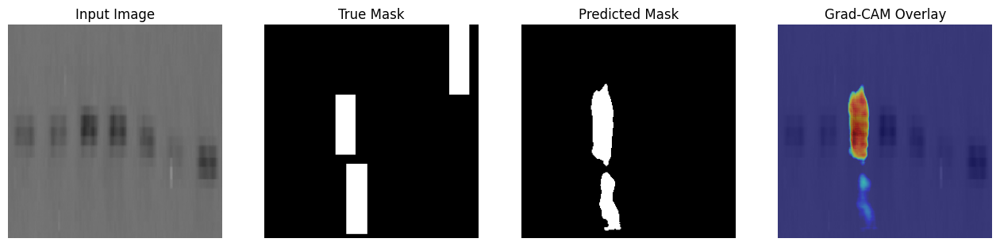

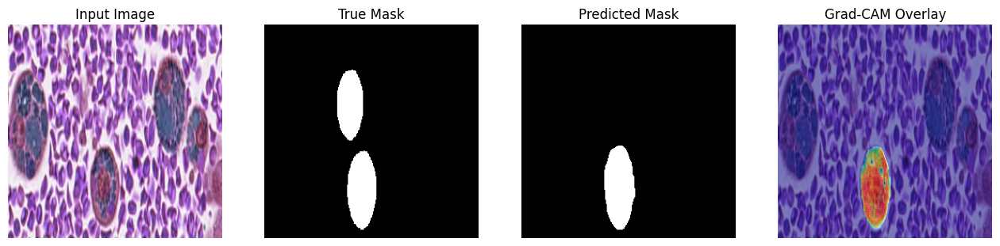

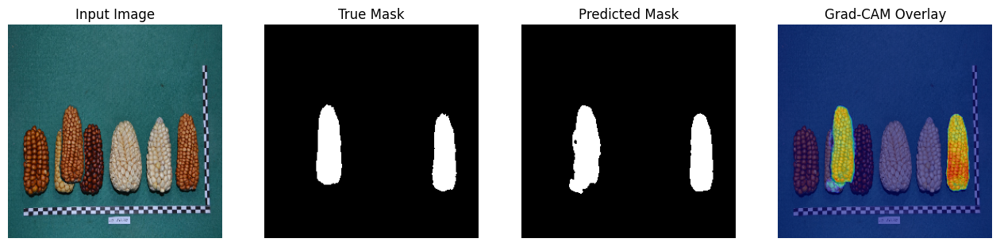

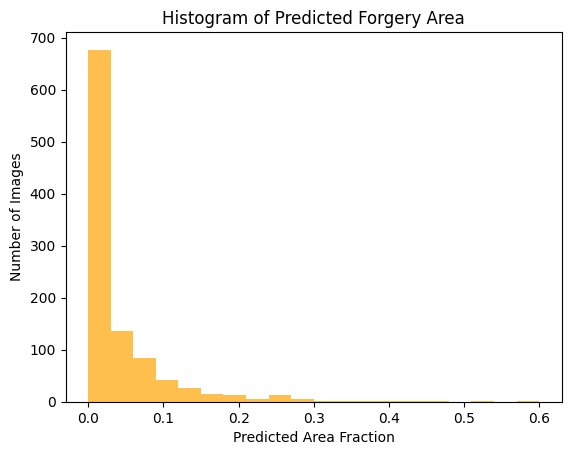

In [51]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import random

# -----------------------------
# Grad-CAM for UNet
# -----------------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad = None
        self.act = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.act = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.grad = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, x):
        self.model.zero_grad()
        logits = self.model(x)
        if logits.shape[2:] != x.shape[2:]:
            logits = F.interpolate(logits, size=x.shape[2:], mode='bilinear', align_corners=False)
        out = logits.sum()
        out.backward()
        w = self.grad.mean(dim=(2,3), keepdim=True)
        cam = F.relu((w * self.act).sum(dim=1, keepdim=True))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# -----------------------------
# Random sampling from loader
# -----------------------------
def get_random_batch(loader, device, n=20):
    all_images, all_masks = [], []
    # Gather all batches
    for images, masks in loader:
        all_images.append(images)
        all_masks.append(masks)
    images_full = torch.cat(all_images, dim=0)
    masks_full = torch.cat(all_masks, dim=0)
    
    total = images_full.size(0)
    idxs = random.sample(range(total), min(n, total))
    return images_full[idxs].to(device), masks_full[idxs].to(device)

# -----------------------------
# Visualize Grad-CAM + mask
# -----------------------------
def visualize_gradcam_random(model, loader, device, n=20):
    model.eval()
    images, masks = get_random_batch(loader, device, n)
    
    # Select target layer: last conv layer of decoder (adjust according to your UNet)
    target_layer = model.decoder.blocks[-1].conv2  # for smp.Unet
    cam_gen = GradCAM(model, target_layer)
    
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    
    cams = cam_gen.generate(images)
    
    images_np = images.cpu().numpy().transpose(0,2,3,1)
    masks_np = masks.cpu().numpy()
    preds_np = preds.cpu().numpy()
    cams_np = cams.detach().cpu().numpy()

    for i in range(images_np.shape[0]):
        fig, ax = plt.subplots(1,4, figsize=(16,4))
        ax[0].imshow(images_np[i])
        ax[0].set_title("Input Image")
        ax[1].imshow(masks_np[i][0], cmap='gray')
        ax[1].set_title("True Mask")
        ax[2].imshow(preds_np[i][0], cmap='gray')
        ax[2].set_title("Predicted Mask")
        ax[3].imshow(images_np[i])
        ax[3].imshow(cams_np[i][0], cmap='jet', alpha=0.5)
        ax[3].set_title("Grad-CAM Overlay")
        for a in ax: a.axis("off")
        plt.show()

# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# -----------------------------
# Run visualizations for 20 random images
# -----------------------------
visualize_gradcam_random(model, val_loader, DEVICE, n=20)

# -----------------------------
# Area fraction histogram
# -----------------------------
areas = compute_pred_area(val_loader, model, DEVICE)
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()


Device: cuda


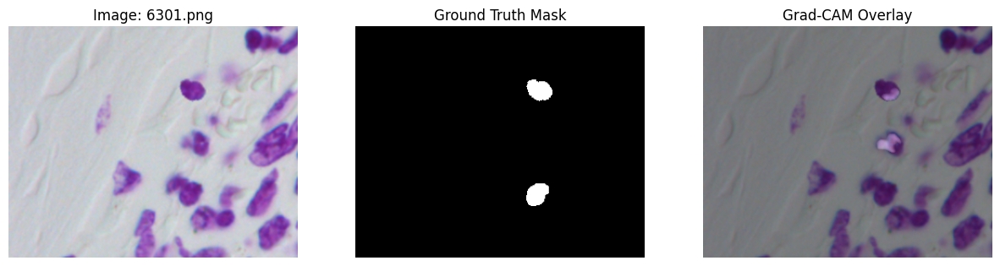

RuntimeError: Wrong input shape height=458, width=1216. Expected image height and width divisible by 32. Consider pad your images to shape (480, 1216).

Arage precision, recall, F1 score and distance

In [97]:
from pathlib import Path

IMAGE_DIR = Path("/kaggle/input/recodai-luc-scientific-image-forgery-detection/train_images")

# Recursively get all images in each subfolder
forged_images = list((IMAGE_DIR / "forged").rglob("*.*"))
authentic_images = list((IMAGE_DIR / "authentic").rglob("*.*"))

# Filter only image extensions
image_exts = [".png", ".jpg", ".jpeg", ".tiff", ".bmp"]
forged_images = [p for p in forged_images if p.suffix.lower() in image_exts]
authentic_images = [p for p in authentic_images if p.suffix.lower() in image_exts]

print("Total images in dataset:")
print(f"Forged: {len(forged_images)}")
print(f"Authentic: {len(authentic_images)}")
print(f"Total: {len(forged_images) + len(authentic_images)}")

# For 25% test split
test_fraction = 0.25
test_forged_count = int(len(forged_images) * test_fraction)
test_authentic_count = int(len(authentic_images) * test_fraction)
test_total_count = test_forged_count + test_authentic_count

print("\nTest subset images (25% of dataset):")
print(f"Forged: {test_forged_count}")
print(f"Authentic: {test_authentic_count}")
print(f"Total: {test_total_count}")


Total images in dataset:
Forged: 2751
Authentic: 2377
Total: 5128

Test subset images (25% of dataset):
Forged: 687
Authentic: 594
Total: 1281


In [98]:
from scipy.ndimage import label, center_of_mass

def localization_metrics(loader, model, device):
    model.eval()
    precisions, recalls, f1s, centroid_distances = [], [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()

            for pred, gt in zip(preds, masks):
                pred_np = pred.squeeze().cpu().numpy().astype(np.uint8)
                gt_np = gt.squeeze().cpu().numpy().astype(np.uint8)

                # Compute pixel-level TP, FP, FN
                TP = np.logical_and(pred_np, gt_np).sum()
                FP = np.logical_and(pred_np, np.logical_not(gt_np)).sum()
                FN = np.logical_and(np.logical_not(pred_np), gt_np).sum()

                precision = TP / (TP + FP + 1e-8)
                recall = TP / (TP + FN + 1e-8)
                f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
                precisions.append(precision)
                recalls.append(recall)
                f1s.append(f1)

                # Centroid distance
                if gt_np.sum() > 0 and pred_np.sum() > 0:
                    gt_center = center_of_mass(gt_np)
                    pred_center = center_of_mass(pred_np)
                    dist = np.sqrt((gt_center[0]-pred_center[0])**2 + (gt_center[1]-pred_center[1])**2)
                    centroid_distances.append(dist)
                else:
                    centroid_distances.append(np.nan)  # no object present

    print(f"Avg Precision: {np.nanmean(precisions):.4f}")
    print(f"Avg Recall: {np.nanmean(recalls):.4f}")
    print(f"Avg F1-score: {np.nanmean(f1s):.4f}")
    print(f"Avg Centroid Distance (pixels): {np.nanmean(centroid_distances):.2f}")

    return precisions, recalls, f1s, centroid_distances

# Call the function
precisions, recalls, f1s, centroid_distances = localization_metrics(val_loader, model, DEVICE)


Avg Precision: 0.4557
Avg Recall: 0.3281
Avg F1-score: 0.3646
Avg Centroid Distance (pixels): 40.88


Precited area

Predicted forgery area fraction (first 10 images): [np.float32(0.03401184), np.float32(0.0032653809), np.float32(0.0042877197), np.float32(0.046875), np.float32(0.08569336), np.float32(0.0), np.float32(0.11817932), np.float32(0.00340271), np.float32(0.010894775), np.float32(0.0010681152)]


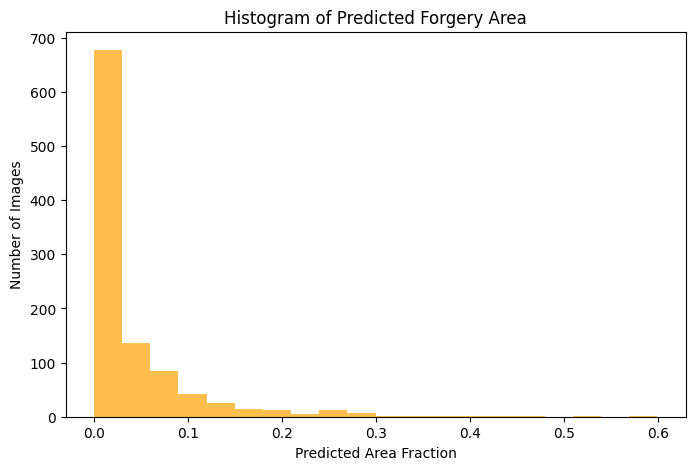

AttributeError: 'str' object has no attribute 'type'

In [99]:
# -----------------------------
# Load trained model
# -----------------------------
import torch
from torch.utils.data import DataLoader, Subset


# -----------------------------
# Optional: Compute area fraction of predicted masks
# -----------------------------
def compute_pred_area(loader, model, device, threshold=0.5):
    model.eval()
    areas = []
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float()
            # Fraction of pixels predicted as forgery
            frac = preds.view(preds.size(0), -1).sum(dim=1) / (preds.size(2)*preds.size(3))
            areas.extend(frac.cpu().numpy())
    return areas

# Call area computation
areas = compute_pred_area(val_loader, model, DEVICE)
print("Predicted forgery area fraction (first 10 images):", areas[:10])

# Optional: plot histogram of predicted areas
import matplotlib.pyplot as plt
plt.figure(figsize=(8,5))
plt.hist(areas, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Area Fraction")
plt.ylabel("Number of Images")
plt.title("Histogram of Predicted Forgery Area")
plt.show()

# -----------------------------
# Visualize Grad-CAM + predicted masks
# -----------------------------
# Adjust Grad-CAM for smp.Unet / SimpleUNet
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import numpy as np

def visualize_gradcam(model, loader, device, n=4):
    model.eval()
    images_shown = 0
    for images, masks in loader:
        images = images.to(device)
        masks  = masks.to(device)
        logits = model(images)
        probs  = torch.sigmoid(logits)
        preds  = (probs > 0.5).float()

        # Use the last conv layer of encoder for Grad-CAM
        try:
            target_layer = model.encoder.layer4  # EfficientNet-B0 encoder last block
        except:
            # fallback if layer does not exist
            target_layer = list(model.children())[-1]

        cam = GradCAM(model=model, target_layers=[target_layer], use_cuda=(DEVICE.type=='cuda'))

        for i in range(images.size(0)):
            img_np = images[i].cpu().permute(1,2,0).numpy()
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-7)
            grayscale_cam = cam(input_tensor=images[i].unsqueeze(0), targets=None)[0]
            cam_image = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

            plt.figure(figsize=(10,4))
            plt.subplot(1,2,1)
            plt.imshow(cam_image)
            plt.title("Grad-CAM Overlay")
            plt.axis("off")

            plt.subplot(1,2,2)
            plt.imshow(preds[i].cpu().squeeze(0), cmap="gray")
            plt.title("Predicted Mask")
            plt.axis("off")

            plt.show()

            images_shown += 1
            if images_shown >= n:
                return

# Visualize
visualize_gradcam(model, val_loader, DEVICE, n=4)

print("✅ Visualization complete")


All precision, recall, etc

In [55]:
from scipy.ndimage import label, center_of_mass

def localization_metrics(loader, model, device):
    model.eval()
    precisions, recalls, f1s, centroid_distances = [], [], [], []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()

            for pred, gt in zip(preds, masks):
                pred_np = pred.squeeze().cpu().numpy().astype(np.uint8)
                gt_np = gt.squeeze().cpu().numpy().astype(np.uint8)

                # Compute pixel-level TP, FP, FN
                TP = np.logical_and(pred_np, gt_np).sum()
                FP = np.logical_and(pred_np, np.logical_not(gt_np)).sum()
                FN = np.logical_and(np.logical_not(pred_np), gt_np).sum()

                precision = TP / (TP + FP + 1e-8)
                recall = TP / (TP + FN + 1e-8)
                f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
                precisions.append(precision)
                recalls.append(recall)
                f1s.append(f1)

                # Centroid distance
                if gt_np.sum() > 0 and pred_np.sum() > 0:
                    gt_center = center_of_mass(gt_np)
                    pred_center = center_of_mass(pred_np)
                    dist = np.sqrt((gt_center[0]-pred_center[0])**2 + (gt_center[1]-pred_center[1])**2)
                    centroid_distances.append(dist)
                else:
                    centroid_distances.append(np.nan)  # no object present

    print(f"Avg Precision: {np.nanmean(precisions):.4f}")
    print(f"Avg Recall: {np.nanmean(recalls):.4f}")
    print(f"Avg F1-score: {np.nanmean(f1s):.4f}")
    print(f"Avg Centroid Distance (pixels): {np.nanmean(centroid_distances):.2f}")

    return precisions, recalls, f1s, centroid_distances

# Call the function
precisions, recalls, f1s, centroid_distances = localization_metrics(val_loader, model, DEVICE)


Avg Precision: 0.4557
Avg Recall: 0.3281
Avg F1-score: 0.3646
Avg Centroid Distance (pixels): 40.88


In [100]:
# -----------------------------
# Compute localization metrics
# -----------------------------
precisions, recalls, f1s, centroid_distances = localization_metrics(val_loader, model, DEVICE)

# -----------------------------
# Print average metrics
# -----------------------------
print("===== Localization Metrics =====")

print(f"Average Centroid Distance (pixels) : {np.nanmean(centroid_distances):.2f}")

# Optional: print first 10 image-wise metrics
print("\nFirst 10 images metrics:")
for i in range(min(10, len(precisions))):
    print(f"Image {i+1}: Precision={precisions[i]:.4f}, Recall={recalls[i]:.4f}, F1={f1s[i]:.4f}, Centroid Dist={centroid_distances[i]:.2f}")


Avg Precision: 0.4557
Avg Recall: 0.3281
Avg F1-score: 0.3646
Avg Centroid Distance (pixels): 40.88
===== Localization Metrics =====
Average Centroid Distance (pixels) : 40.88

First 10 images metrics:
Image 1: Precision=0.8309, Recall=0.7429, F1=0.7844, Centroid Dist=15.84
Image 2: Precision=0.9486, Recall=0.4501, F1=0.6105, Centroid Dist=58.98
Image 3: Precision=0.8470, Recall=0.4034, F1=0.5465, Centroid Dist=7.94
Image 4: Precision=0.8525, Recall=0.4482, F1=0.5875, Centroid Dist=56.92
Image 5: Precision=0.9598, Recall=0.9646, F1=0.9622, Centroid Dist=3.61
Image 6: Precision=0.0000, Recall=0.0000, F1=0.0000, Centroid Dist=nan
Image 7: Precision=0.9832, Recall=0.9822, F1=0.9827, Centroid Dist=0.78
Image 8: Precision=0.0000, Recall=0.0000, F1=0.0000, Centroid Dist=23.39
Image 9: Precision=0.0000, Recall=0.0000, F1=0.0000, Centroid Dist=62.65
Image 10: Precision=0.0000, Recall=0.0000, F1=0.0000, Centroid Dist=106.18


In [ ]:
Good metrics

In [102]:
import numpy as np
import torch
from scipy.ndimage import center_of_mass

def forgery_localization_metrics(loader, model, device):
    model.eval()

    ious = []
    centroid_distances = []
    forged_area_gt = []
    forged_area_pred = []
    abs_area_errors = []
    rel_area_diffs = []
    TCRs = []
    FARs = []

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device)
            masks = masks.to(device)

            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()

            for pred, gt in zip(preds, masks):
                pred = pred.squeeze().cpu().numpy().astype(np.uint8)
                gt = gt.squeeze().cpu().numpy().astype(np.uint8)

                total_pixels = gt.size

                # -----------------------------
                # Pixel-level counts
                # -----------------------------
                TP = np.logical_and(pred == 1, gt == 1).sum()
                FP = np.logical_and(pred == 1, gt == 0).sum()
                FN = np.logical_and(pred == 0, gt == 1).sum()
                TN = np.logical_and(pred == 0, gt == 0).sum()

                # -----------------------------
                # A) Localization Metrics
                # -----------------------------
                iou = TP / (TP + FP + FN + 1e-8)
                ious.append(iou)

                if gt.sum() > 0 and pred.sum() > 0:
                    gt_center = center_of_mass(gt)
                    pred_center = center_of_mass(pred)
                    dist = np.sqrt(
                        (gt_center[0] - pred_center[0])**2 +
                        (gt_center[1] - pred_center[1])**2
                    )
                else:
                    dist = np.nan

                centroid_distances.append(dist)

                # -----------------------------
                # B) Area-based Measures
                # -----------------------------
                gt_area = gt.sum()
                pred_area = pred.sum()

                forged_area_gt.append(gt_area / total_pixels * 100)
                forged_area_pred.append(pred_area / total_pixels * 100)

                abs_area_error = abs(pred_area - gt_area) / total_pixels * 100
                abs_area_errors.append(abs_area_error)

                rel_area_diff = abs(pred_area - gt_area) / (gt_area + 1e-8) * 100
                rel_area_diffs.append(rel_area_diff)

                # -----------------------------
                # C) Forgery-Specific Metrics
                # -----------------------------
                # Tamper Coverage Rate (TCR)
                TCR = TP / (gt_area + 1e-8)
                TCRs.append(TCR)

                # False Alarm Rate (FAR)
                FAR = FP / (TN + FP + 1e-8)
                FARs.append(FAR)

    # -----------------------------
    # Print Results
    # -----------------------------
    print("\n========== FORGERY LOCALIZATION METRICS ==========")

    print(f"Mean IoU (Overlap Ratio): {np.nanmean(ious):.4f}")
    print(f"Mean Localization Error (pixels): {np.nanmean(centroid_distances):.2f}")

    print("\n--- Area-Based Measures ---")
    print(f"Avg Ground Truth Forged Area (%): {np.mean(forged_area_gt):.2f}%")
    print(f"Avg Predicted Forged Area (%): {np.mean(forged_area_pred):.2f}%")
    print(f"Avg Absolute Area Error (%): {np.mean(abs_area_errors):.2f}%")
    print(f"Avg Relative Area Difference (%): {np.mean(rel_area_diffs):.2f}%")

    print("\n--- Forgery-Specific Metrics ---")
    print(f"Mean Tamper Coverage Rate (TCR): {np.mean(TCRs):.4f}")
    print(f"Mean False Alarm Rate (FAR): {np.mean(FARs):.4f}")

    print("=================================================\n")

    return {
        "IoU": ious,
        "Centroid Distance": centroid_distances,
        "GT Area %": forged_area_gt,
        "Pred Area %": forged_area_pred,
        "Abs Area Error %": abs_area_errors,
        "Rel Area Diff %": rel_area_diffs,
        "TCR": TCRs,
        "FAR": FARs
    }


In [103]:
# ============================================================
# COMPLETE FORGERY LOCALIZATION + EXPLAINABILITY METRICS
# ============================================================

import numpy as np
import torch
from scipy.spatial.distance import euclidean

# ----------------------------
# Helper functions
# ----------------------------
def compute_centroid(mask):
    coords = np.column_stack(np.where(mask > 0))
    if coords.shape[0] == 0:
        return None
    return coords.mean(axis=0)

def iou_score(pred, gt, eps=1e-7):
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return (inter + eps) / (union + eps)

# ----------------------------
# Main metric function
# ----------------------------
def forgery_localization_metrics(val_loader, model, device, threshold=0.5):

    model.eval()

    ious = []
    localization_errors = []

    gt_area_pcts = []
    pred_area_pcts = []
    abs_area_errors = []
    rel_area_diffs = []

    tcr_list = []
    far_list = []

    MIN_GT_PIXELS = 10  # ignore noise / authentic images

    with torch.no_grad():
        for images, gt_masks in val_loader:
            images = images.to(device)
            gt_masks = gt_masks.to(device)

            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float()

            for i in range(images.size(0)):
                gt = gt_masks[i, 0].cpu().numpy().astype(np.uint8)
                pred = preds[i, 0].cpu().numpy().astype(np.uint8)

                total_pixels = float(gt.size)
                gt_pixels = float(gt.sum())
                pred_pixels = float(pred.sum())

                # ---------------- A) Localization Accuracy ----------------
                ious.append(iou_score(pred, gt))

                gt_centroid = compute_centroid(gt)
                pred_centroid = compute_centroid(pred)

                if gt_centroid is not None and pred_centroid is not None:
                    localization_errors.append(
                        euclidean(gt_centroid, pred_centroid)
                    )

                # ---------------- B) Area-Based Measures ----------------
                gt_area_pct = (gt_pixels / total_pixels) * 100.0
                pred_area_pct = (pred_pixels / total_pixels) * 100.0

                gt_area_pcts.append(gt_area_pct)
                pred_area_pcts.append(pred_area_pct)

                abs_area_errors.append(abs(pred_area_pct - gt_area_pct))

                # ✅ FIXED RELATIVE AREA DIFFERENCE
                if gt_pixels >= MIN_GT_PIXELS:
                    rel_area_diffs.append(
                        abs(pred_pixels - gt_pixels) / gt_pixels * 100.0
                    )
                else:
                    rel_area_diffs.append(np.nan)

                # ---------------- C) Forgery-Specific Metrics ----------------
                # Tamper Coverage Rate (TCR)
                if gt_pixels >= MIN_GT_PIXELS:
                    tcr_list.append(
                        np.logical_and(pred == 1, gt == 1).sum() / gt_pixels
                    )

                # False Alarm Rate (FAR)
                authentic_pixels = total_pixels - gt_pixels
                if authentic_pixels > 0:
                    far_list.append(
                        np.logical_and(pred == 1, gt == 0).sum()
                        / authentic_pixels
                    )

    return {
        "IoU": np.nanmean(ious),
        "Localization_Error_pixels": np.nanmean(localization_errors),

        "GT_Area_%": np.nanmean(gt_area_pcts),
        "Pred_Area_%": np.nanmean(pred_area_pcts),
        "Absolute_Area_Error_%": np.nanmean(abs_area_errors),
        "Relative_Area_Difference_%": np.nanmean(rel_area_diffs),

        "TCR": np.nanmean(tcr_list),
        "FAR": np.nanmean(far_list),
    }

# ----------------------------
# CALL & PRINT RESULTS
# ----------------------------
metrics = forgery_localization_metrics(val_loader, model, DEVICE)

print("========= FORGERY LOCALIZATION METRICS ==========")
print(f"Mean IoU (Overlap Ratio): {metrics['IoU']:.4f}")
print(f"Mean Localization Error (pixels): {metrics['Localization_Error_pixels']:.2f}")

print("\n--- Area-Based Measures ---")
print(f"Avg GT Forged Area (%): {metrics['GT_Area_%']:.2f}%")
print(f"Avg Pred Forged Area (%): {metrics['Pred_Area_%']:.2f}%")
print(f"Avg Absolute Area Error (%): {metrics['Absolute_Area_Error_%']:.2f}%")
print(f"Avg Relative Area Difference (%): {metrics['Relative_Area_Difference_%']:.2f}%")

print("\n--- Forgery-Specific Metrics ---")
print(f"Mean Tamper Coverage Rate (TCR): {metrics['TCR']:.4f}")
print(f"Mean False Alarm Rate (FAR): {metrics['FAR']:.4f}")


========= FORGERY LOCALIZATION METRICS ==========
Mean IoU (Overlap Ratio): 0.4057
Mean Localization Error (pixels): 40.88

--- Area-Based Measures ---
Avg GT Forged Area (%): 4.45%
Avg Pred Forged Area (%): 3.78%
Avg Absolute Area Error (%): 1.64%
Avg Relative Area Difference (%): 43.46%

--- Forgery-Specific Metrics ---
Mean Tamper Coverage Rate (TCR): 0.4722
Mean False Alarm Rate (FAR): 0.0138


In [104]:
# ============================================================
# COMPLETE FORGERY LOCALIZATION + EXPLAINABILITY METRICS
# ============================================================

import numpy as np
import torch
from scipy.spatial.distance import euclidean

# ----------------------------
# Helper functions
# ----------------------------
def compute_centroid(mask):
    coords = np.column_stack(np.where(mask > 0))
    if coords.shape[0] == 0:
        return None
    return coords.mean(axis=0)

def iou_score(pred, gt, eps=1e-7):
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return (inter + eps) / (union + eps)

# ----------------------------
# Main metric function
# ----------------------------
def forgery_localization_metrics(val_loader, model, device, threshold=0.5):

    model.eval()

    ious = []
    localization_errors = []

    gt_area_pcts = []
    pred_area_pcts = []
    abs_area_errors = []
    rel_area_diffs = []

    tcr_list = []
    far_list = []

    MIN_GT_PIXELS = 10  # ignore noise / authentic images

    with torch.no_grad():
        for images, gt_masks in val_loader:
            images = images.to(device)
            gt_masks = gt_masks.to(device)

            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float()

            for i in range(images.size(0)):
                gt = gt_masks[i, 0].cpu().numpy().astype(np.uint8)
                pred = preds[i, 0].cpu().numpy().astype(np.uint8)

                total_pixels = float(gt.size)
                gt_pixels = float(gt.sum())
                pred_pixels = float(pred.sum())

                # ---------------- A) Localization Accuracy ----------------
                ious.append(iou_score(pred, gt))

                gt_centroid = compute_centroid(gt)
                pred_centroid = compute_centroid(pred)

                if gt_centroid is not None and pred_centroid is not None:
                    localization_errors.append(
                        euclidean(gt_centroid, pred_centroid)
                    )

                # ---------------- B) Area-Based Measures ----------------
                gt_area_pct = (gt_pixels / total_pixels) * 100.0
                pred_area_pct = (pred_pixels / total_pixels) * 100.0

                gt_area_pcts.append(gt_area_pct)
                pred_area_pcts.append(pred_area_pct)

                abs_area_errors.append(abs(pred_area_pct - gt_area_pct))

                # ✅ FIXED RELATIVE AREA DIFFERENCE
                if gt_pixels >= MIN_GT_PIXELS:
                    rel_area_diffs.append(
                        abs(pred_pixels - gt_pixels) / gt_pixels * 100.0
                    )
                else:
                    rel_area_diffs.append(np.nan)

                # ---------------- C) Forgery-Specific Metrics ----------------
                # Tamper Coverage Rate (TCR)
                if gt_pixels >= MIN_GT_PIXELS:
                    tcr_list.append(
                        np.logical_and(pred == 1, gt == 1).sum() / gt_pixels
                    )

                # False Alarm Rate (FAR)
                authentic_pixels = total_pixels - gt_pixels
                if authentic_pixels > 0:
                    far_list.append(
                        np.logical_and(pred == 1, gt == 0).sum()
                        / authentic_pixels
                    )

    return {
        "IoU": np.nanmean(ious),
        "Localization_Error_pixels": np.nanmean(localization_errors),

        "GT_Area_%": np.nanmean(gt_area_pcts),
        "Pred_Area_%": np.nanmean(pred_area_pcts),
        "Absolute_Area_Error_%": np.nanmean(abs_area_errors),
        "Relative_Area_Difference_%": np.nanmean(rel_area_diffs),

        "TCR": np.nanmean(tcr_list),
        "FAR": np.nanmean(far_list),
    }

# ----------------------------
# CALL & PRINT RESULTS
# ----------------------------
metrics = forgery_localization_metrics(val_loader, model, DEVICE)

print("========= FORGERY LOCALIZATION METRICS ==========")
print(f"Mean IoU (Overlap Ratio): {metrics['IoU']:.4f}")
print(f"Mean Localization Error (pixels): {metrics['Localization_Error_pixels']:.2f}")

print("\n--- Area-Based Measures ---")
print(f"Avg GT Forged Area (%): {metrics['GT_Area_%']:.2f}%")
print(f"Avg Pred Forged Area (%): {metrics['Pred_Area_%']:.2f}%")
print(f"Avg Absolute Area Error (%): {metrics['Absolute_Area_Error_%']:.2f}%")
print(f"Avg Relative Area Difference (%): {metrics['Relative_Area_Difference_%']:.2f}%")

print("\n--- Forgery-Specific Metrics ---")
print(f"Mean Tamper Coverage Rate (TCR): {metrics['TCR']:.4f}")
print(f"Mean False Alarm Rate (FAR): {metrics['FAR']:.4f}")


========= FORGERY LOCALIZATION METRICS ==========
Mean IoU (Overlap Ratio): 0.4057
Mean Localization Error (pixels): 40.88

--- Area-Based Measures ---
Avg GT Forged Area (%): 4.45%
Avg Pred Forged Area (%): 3.78%
Avg Absolute Area Error (%): 1.64%
Avg Relative Area Difference (%): 43.46%

--- Forgery-Specific Metrics ---
Mean Tamper Coverage Rate (TCR): 0.4722
Mean False Alarm Rate (FAR): 0.0138


In [112]:
import numpy as np
from scipy.ndimage import center_of_mass

def forgery_localization_metrics(loader, model, device):
    model.eval()
    
    IoUs = []
    loc_errors = []
    gt_area_perc = []
    pred_area_perc = []
    abs_area_errors = []
    rel_area_diffs = []
    TCRs = []
    FARs = []

    with torch.no_grad():
        for images, masks in loader:
            images, masks = images.to(device), masks.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()

            for pred, gt in zip(preds, masks):
                pred_np = pred.squeeze().cpu().numpy().astype(np.uint8)
                gt_np = gt.squeeze().cpu().numpy().astype(np.uint8)
                H, W = gt_np.shape
                total_pixels = H * W

                # --- IoU / Overlap ratio ---
                inter = np.logical_and(pred_np, gt_np).sum()
                union = np.logical_or(pred_np, gt_np).sum()
                IoU = inter / (union + 1e-8)
                IoUs.append(IoU)

                # --- Localization Error (centroid distance) ---
                if gt_np.sum() > 0 and pred_np.sum() > 0:
                    gt_center = center_of_mass(gt_np)
                    pred_center = center_of_mass(pred_np)
                    loc_err = np.sqrt((gt_center[0]-pred_center[0])**2 + (gt_center[1]-pred_center[1])**2)
                else:
                    loc_err = np.nan
                loc_errors.append(loc_err)

                # --- Area-based measures ---
                gt_area = float(gt_np.sum())
                pred_area = float(pred_np.sum())

                gt_perc = gt_area / total_pixels * 100
                pred_perc = pred_area / total_pixels * 100
                gt_area_perc.append(gt_perc)
                pred_area_perc.append(pred_perc)

                abs_area_errors.append(abs(pred_perc - gt_perc))
                if gt_perc > 0:
                    rel_area_diffs.append(abs(pred_perc - gt_perc) / gt_perc * 100)
                    TCRs.append(inter / gt_area)
                else:
                    rel_area_diffs.append(0)
                    TCRs.append(0)

                # --- False Alarm Rate ---
                authentic_area = total_pixels - gt_area
                fp = np.logical_and(pred_np, np.logical_not(gt_np)).sum()
                FARs.append(fp / (authentic_area + 1e-8))

    metrics = {
        "IoU": np.nanmean(IoUs),
        "Localization_Error_pixels": np.nanmean(loc_errors),
        "GT_Forged_Area_percent": np.nanmean(gt_area_perc),
        "Pred_Forged_Area_percent": np.nanmean(pred_area_perc),
        "Abs_Area_Error_percent": np.nanmean(abs_area_errors),
        "Rel_Area_Diff_percent": np.nanmean(rel_area_diffs),
        "TCR": np.nanmean(TCRs),
        "FAR": np.nanmean(FARs)
    }

    return metrics

# -----------------------------
# Call metrics
# -----------------------------
metrics = forgery_localization_metrics(val_loader, model, DEVICE)

print("========== FORGERY LOCALIZATION METRICS ==========")
print(f"Mean IoU (Overlap Ratio): {metrics['IoU']:.4f}")
print(f"Mean Localization Error (pixels): {metrics['Localization_Error_pixels']:.2f}")

print("\n--- Area-Based Measures ---")
print(f"Avg GT Forged Area (%): {metrics['GT_Forged_Area_percent']:.2f}%")
print(f"Avg Pred Forged Area (%): {metrics['Pred_Forged_Area_percent']:.2f}%")
print(f"Avg Absolute Area Error (%): {metrics['Abs_Area_Error_percent']:.2f}%")
print(f"Avg Relative Area Difference (%): {metrics['Rel_Area_Diff_percent']:.2f}%")

print("\n--- Forgery-Specific Metrics ---")
print(f"Mean Tamper Coverage Rate (TCR): {metrics['TCR']:.4f}")
print(f"Mean False Alarm Rate (FAR): {metrics['FAR']:.4f}")


========== FORGERY LOCALIZATION METRICS ==========
Mean IoU (Overlap Ratio): 0.2926
Mean Localization Error (pixels): 40.88

--- Area-Based Measures ---
Avg GT Forged Area (%): 4.45%
Avg Pred Forged Area (%): 3.78%
Avg Absolute Area Error (%): 1.64%
Avg Relative Area Difference (%): 30.20%

--- Forgery-Specific Metrics ---
Mean Tamper Coverage Rate (TCR): 0.3281
Mean False Alarm Rate (FAR): 0.0138


In [115]:
# -----------------------------
# Imports (ensure these are already imported)
# -----------------------------
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split
import numpy as np
from tqdm import tqdm
from scipy.ndimage import center_of_mass

# -----------------------------
# Use 25% of training data as test
# -----------------------------
test_fraction = 0.25
train_idx, test_idx = train_test_split(train_idx, test_size=test_fraction, random_state=RANDOM_STATE, shuffle=True)

test_ds = Subset(dataset, test_idx)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
print("Test samples:", len(test_ds))

# -----------------------------
# Load model
# -----------------------------
model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=DEVICE))
model.to(DEVICE)
model.eval()

# -----------------------------
# Evaluation function for Dice, IoU, Loss
# -----------------------------
def evaluate_model(model, loader, device):
    dice_scores = []
    iou_scores = []
    losses = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Evaluating"):
            images, masks = images.to(device), masks.to(device)
            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            # Compute loss
            loss = combined_loss(logits, masks)
            losses.append(loss.item())

            # Compute Dice and IoU
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float().squeeze(1)
            gts   = masks.squeeze(1)

            dice_scores.append(dice_coef_mask(preds, gts).mean().item())
            iou_scores.append(iou_mask(preds, gts).mean().item())

    avg_loss = float(np.mean(losses))
    avg_dice = float(np.mean(dice_scores))
    avg_iou  = float(np.mean(iou_scores))

    print(f"Test Loss: {avg_loss:.4f} | Dice: {avg_dice:.4f} | IoU: {avg_iou:.4f}")
    return avg_loss, avg_dice, avg_iou

# Evaluate Dice, IoU, Loss
evaluate_model(model, test_loader, DEVICE)

# -----------------------------
# Forgery Localization Metrics
# -----------------------------
def forgery_localization_metrics(loader, model, device):
    IoUs = []
    loc_errors = []
    gt_area_perc = []
    pred_area_perc = []
    abs_area_errors = []
    rel_area_diffs = []
    TCRs = []
    FARs = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Calculating Metrics"):
            images, masks = images.to(device), masks.to(device)
            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()

            for pred, gt in zip(preds, masks):
                pred_np = pred.squeeze().cpu().numpy().astype(np.uint8)
                gt_np = gt.squeeze().cpu().numpy().astype(np.uint8)
                H, W = gt_np.shape
                total_pixels = H * W

                # IoU / Overlap ratio
                inter = np.logical_and(pred_np, gt_np).sum()
                union = np.logical_or(pred_np, gt_np).sum()
                IoU = inter / (union + 1e-8)
                IoUs.append(IoU)

                # Localization Error (centroid distance)
                if gt_np.sum() > 0 and pred_np.sum() > 0:
                    gt_center = center_of_mass(gt_np)
                    pred_center = center_of_mass(pred_np)
                    loc_err = np.sqrt((gt_center[0]-pred_center[0])**2 + (gt_center[1]-pred_center[1])**2)
                else:
                    loc_err = 0
                loc_errors.append(loc_err)

                # Area-based measures
                gt_area = float(gt_np.sum())
                pred_area = float(pred_np.sum())

                gt_perc = gt_area / total_pixels * 100
                pred_perc = pred_area / total_pixels * 100
                gt_area_perc.append(gt_perc)
                pred_area_perc.append(pred_perc)

                # Absolute area error
                abs_area_errors.append(abs(pred_perc - gt_perc))

                # Relative area difference (only for non-zero GT area)
                if gt_perc > 0:
                    rel_area_diffs.append(abs(pred_perc - gt_perc) / gt_perc * 100)
                else:
                    rel_area_diffs.append(0)

                # Tamper Coverage Rate (TCR)
                if gt_area > 0:
                    TCRs.append(inter / gt_area)
                else:
                    TCRs.append(0)

                # False Alarm Rate (FAR)
                authentic_area = total_pixels - gt_area
                fp = np.logical_and(pred_np, np.logical_not(gt_np)).sum()
                FARs.append(fp / (authentic_area + 1e-8))

    metrics = {
        "IoU": np.mean(IoUs),
        "Localization_Error_pixels": np.mean(loc_errors),
        "GT_Forged_Area_percent": np.mean(gt_area_perc),
        "Pred_Forged_Area_percent": np.mean(pred_area_perc),
        "Abs_Area_Error_percent": np.mean(abs_area_errors),
        "Rel_Area_Diff_percent": np.mean(rel_area_diffs),
        "TCR": np.mean(TCRs),
        "FAR": np.mean(FARs)
    }

    return metrics

# Compute metrics
metrics = forgery_localization_metrics(test_loader, model, DEVICE)

# -----------------------------
# Print results
# -----------------------------
print("\n========== FORGERY LOCALIZATION METRICS ==========")
print(f"Mean IoU (Overlap Ratio): {metrics['IoU']:.4f}")
print(f"Mean Localization Error (pixels): {metrics['Localization_Error_pixels']:.2f}")

print("\n--- Area-Based Measures ---")
print(f"Avg GT Forged Area (%): {metrics['GT_Forged_Area_percent']:.2f}%")
print(f"Avg Pred Forged Area (%): {metrics['Pred_Forged_Area_percent']:.2f}%")
print(f"Avg Absolute Area Error (%): {metrics['Abs_Area_Error_percent']:.2f}%")
print(f"Avg Relative Area Difference (%): {metrics['Rel_Area_Diff_percent']:.2f}%")

print("\n--- Forgery-Specific Metrics ---")
print(f"Mean Tamper Coverage Rate (TCR): {metrics['TCR']:.4f}")
print(f"Mean False Alarm Rate (FAR): {metrics['FAR']:.4f}")
import matplotlib.pyplot as plt

# Get predicted area fractions for test set
pred_area_percentages = []
for images, masks in test_loader:
    images = images.to(DEVICE)
    with torch.no_grad():
        logits = model(images)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
    for pred, mask in zip(preds, masks):
        H, W = mask.shape[1], mask.shape[2]
        total_pixels = H * W
        pred_area = float(pred.squeeze().cpu().numpy().sum())
        pred_area_percentages.append(pred_area / total_pixels * 100)
# Create output directory if it doesn't exist
output_dir = "/kaggle/working/plots"
os.makedirs(output_dir, exist_ok=True)

# Path to save the figure
save_path = os.path.join(output_dir, "predicted_forgery_area_hist.png")

# Plot histogram
plt.figure(figsize=(8,5))
plt.hist(pred_area_percentages, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Forged Area (%)", fontsize=16)
plt.ylabel("Number of Images", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
#plt.title("Histogram of Predicted Forgery Area (Test Set)", fontsize=18)
plt.show()

# Save figure at 300 DPI
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"Figure saved at: {save_path}")



Test samples: 1


Evaluating:   0%|          | 0/1 [00:00<?, ?it/s]


IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/fetch.py", line 50, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataset.py", line 416, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
            ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_55/2966848970.py", line 86, in __getitem__
    img_path = self.image_paths[idx]
               ~~~~~~~~~~~~~~~~^^^^^
IndexError: list index out of range


In [110]:
num_images = sum(images.size(0) for images, _ in test_loader)
print(f"Number of images in the test dataset: {num_images}")

IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/fetch.py", line 50, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataset.py", line 416, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
            ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_55/2966848970.py", line 86, in __getitem__
    img_path = self.image_paths[idx]
               ~~~~~~~~~~~~~~~~^^^^^
IndexError: list index out of range


In [86]:
num_test_images = len(test_ds)
print(f"Number of images in the test dataset: {num_test_images}")

Number of images in the test dataset: 433


Total images in dataset:
Forged: 0
Authentic: 0
Total: 0


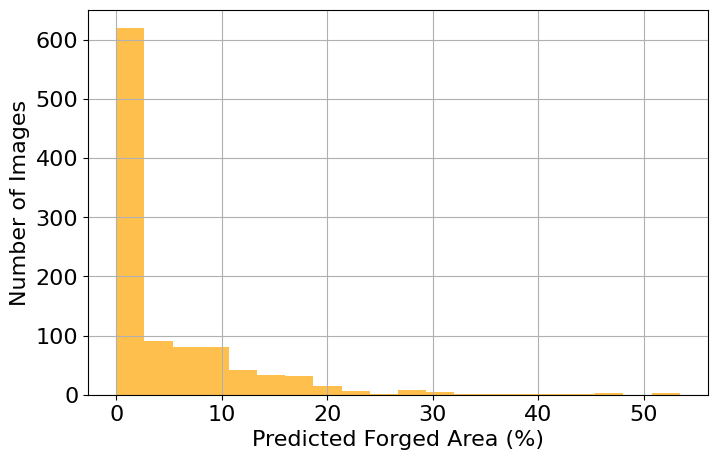

Figure saved at: /kaggle/working/plots/predicted_forgery_area_hist.png


In [64]:
# Create output directory if it doesn't exist
output_dir = "/kaggle/working/plots"
os.makedirs(output_dir, exist_ok=True)

# Path to save the figure
save_path = os.path.join(output_dir, "predicted_forgery_area_hist.png")

# Plot histogram
plt.figure(figsize=(8,5))
plt.hist(pred_area_percentages, bins=20, color='orange', alpha=0.7)
plt.xlabel("Predicted Forged Area (%)", fontsize=16)
plt.ylabel("Number of Images", fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#plt.title("Histogram of Predicted Forgery Area (Test Set)", fontsize=16)
plt.grid(True)

# Save figure at 300 DPI
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"Figure saved at: {save_path}")

In [65]:
# -----------------------------
# Imports
# -----------------------------
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, matthews_corrcoef, hamming_loss
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# -----------------------------
# Use 25% of training data as test
# -----------------------------
test_fraction = 0.25
train_idx, test_idx = train_test_split(train_idx, test_size=test_fraction, random_state=RANDOM_STATE, shuffle=True)

test_ds = Subset(dataset, test_idx)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
print("Test samples:", len(test_ds))

# -----------------------------
# Full evaluation function
# -----------------------------
def evaluate_segmentation_model(model, loader, device, threshold=0.5):
    model.eval()

    all_dices = []
    all_ious  = []
    all_accuracies = []
    all_precisions = []
    all_recalls = []
    all_f1s = []
    all_specificities = []
    all_mccs = []
    all_hamming = []
    all_losses = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Evaluating"):
            images = images.to(device, dtype=torch.float32)
            masks  = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            # Probabilities and binary predictions
            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float().squeeze(1)
            gts   = masks.squeeze(1)

            # Flatten for sklearn metrics
            preds_flat = preds.cpu().numpy().reshape(-1)
            gts_flat = gts.cpu().numpy().reshape(-1)

            # Pixel-wise metrics
            acc = accuracy_score(gts_flat, preds_flat)
            prec = precision_score(gts_flat, preds_flat, zero_division=0)
            rec = recall_score(gts_flat, preds_flat, zero_division=0)
            f1 = f1_score(gts_flat, preds_flat, zero_division=0)
            mcc = matthews_corrcoef(gts_flat, preds_flat)
            hamming = hamming_loss(gts_flat, preds_flat)

            # Specificity = TN / (TN + FP)
            tn, fp, fn, tp = confusion_matrix(gts_flat, preds_flat, labels=[0,1]).ravel()
            specificity = tn / (tn + fp + 1e-7)

            # Dice
            intersection = (preds * gts).sum(dim=(1,2))
            union = preds.sum(dim=(1,2)) + gts.sum(dim=(1,2))
            dice = ((2*intersection + 1e-7) / (union + 1e-7)).mean().item()

            # IoU
            inter = (preds * gts).sum(dim=(1,2))
            union_iou = (preds + gts - preds*gts).sum(dim=(1,2))
            iou = (inter / (union_iou + 1e-7)).mean().item()

            # Loss
            loss = combined_loss(logits, masks).item()

            # Append
            all_dices.append(dice)
            all_ious.append(iou)
            all_accuracies.append(acc)
            all_precisions.append(prec)
            all_recalls.append(rec)
            all_f1s.append(f1)
            all_specificities.append(specificity)
            all_mccs.append(mcc)
            all_hamming.append(hamming)
            all_losses.append(loss)

    # Aggregate
    metrics = {
        "Loss": np.mean(all_losses),
        "Dice": np.mean(all_dices),
        "IoU": np.mean(all_ious),
        "Accuracy": np.mean(all_accuracies),
        "Precision": np.mean(all_precisions),
        "Recall": np.mean(all_recalls),
        "F1-score": np.mean(all_f1s),
        "Specificity": np.mean(all_specificities),
        "MCC": np.mean(all_mccs),
        "Hamming Loss": np.mean(all_hamming)
    }

    print("\n--- Test Set Evaluation Metrics ---")
    for k, v in metrics.items():
        print(f"{k}: {v:.4f}")

    return metrics

# -----------------------------
# Evaluate on Test Set (using the already trained model)
# -----------------------------
metrics = evaluate_segmentation_model(model, test_loader, DEVICE)


Test samples: 769


Evaluating: 100%|██████████| 97/97 [00:20<00:00,  4.78it/s]


--- Test Set Evaluation Metrics ---
Loss: 0.5157
Dice: 0.7156
IoU: 0.4616
Accuracy: 0.9914
Precision: 0.8650
Recall: 0.8969
F1-score: 0.8774
Specificity: 0.9945
MCC: 0.8748
Hamming Loss: 0.0086


CM

In [89]:
# -----------------------------
# Imports
# -----------------------------
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# -----------------------------
# Use 25% of training data as test
# -----------------------------
test_fraction = 0.25
train_idx, test_idx = train_test_split(train_idx, test_size=test_fraction, random_state=RANDOM_STATE, shuffle=True)

test_ds = Subset(dataset, test_idx)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
print("Test samples:", len(test_ds))

# -----------------------------
# Function to plot confusion matrix
# -----------------------------
def plot_confusion_matrix(model, loader, device, threshold=0.5, normalize=False, save_path="confusion_matrix.png"):
    """
    Compute pixel-wise confusion matrix, plot it with larger fonts and save as high-res image
    """
    model.eval()
    all_preds = []
    all_gts = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Computing Confusion Matrix"):
            images = images.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float().squeeze(1)
            gts = masks.squeeze(1)

            all_preds.append(preds.cpu().numpy().reshape(-1))
            all_gts.append(gts.cpu().numpy().reshape(-1))

    # Flatten all batches
    all_preds = np.concatenate(all_preds)
    all_gts = np.concatenate(all_gts)

    cm = confusion_matrix(all_gts, all_preds, labels=[0,1])

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6,5))
    ax = sns.heatmap(
        cm, annot=True, fmt=".2f" if normalize else "d", cmap="Blues",
        xticklabels=["Authentic (0)", "Forged (1)"],
        yticklabels=["Authentic (0)", "Forged (1)"],
        cbar=True,
        annot_kws={"size":16}  # annotation text size
    )

    # Set font size for ticks and labels
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("Predicted", fontsize=16)
    plt.ylabel("True", fontsize=16)

    # Increase colorbar tick size
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=16)

    # Save figure as high-resolution PNG
    plt.savefig(save_path, dpi=500, bbox_inches='tight')
    print(f"Confusion matrix saved to {save_path}")
    plt.show()

# -----------------------------
# Plot and save confusion matrices
# -----------------------------
plot_confusion_matrix(model, test_loader, DEVICE, threshold=0.5, normalize=False, save_path="confusion_matrix_raw.png")
plot_confusion_matrix(model, test_loader, DEVICE, threshold=0.5, normalize=True, save_path="confusion_matrix_normalized.png")


Test samples: 183


Computing Confusion Matrix:   0%|          | 0/23 [00:00<?, ?it/s]


IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/fetch.py", line 50, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataset.py", line 416, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
            ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_55/2966848970.py", line 86, in __getitem__
    img_path = self.image_paths[idx]
               ~~~~~~~~~~~~~~~~^^^^^
IndexError: list index out of range


In [96]:
# -----------------------------
# Imports
# -----------------------------
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Subset, DataLoader
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# -----------------------------
# Use 25% of training data as test
# -----------------------------
test_fraction = 0.99
train_idx, test_idx = train_test_split(train_idx, test_size=test_fraction, random_state=RANDOM_STATE, shuffle=True)

test_ds = Subset(dataset, test_idx)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
print("Test samples:", len(test_ds))

# -----------------------------
# Function to plot confusion matrix
# -----------------------------
def plot_confusion_matrix(model, loader, device, threshold=0.5, normalize=False, save_path="confusion_matrix.png"):
    model.eval()
    all_preds = []
    all_gts = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Computing Confusion Matrix"):
            images = images.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float().squeeze(1)
            gts = masks.squeeze(1)

            all_preds.append(preds.cpu().numpy().reshape(-1))
            all_gts.append(gts.cpu().numpy().reshape(-1))

    all_preds = np.concatenate(all_preds)
    all_gts = np.concatenate(all_gts)

    cm = confusion_matrix(all_gts, all_preds, labels=[0,1])

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(6,5))
    ax = sns.heatmap(
        cm, annot=True, fmt=".2f" if normalize else "d", cmap="Blues",
        xticklabels=["Authentic (0)", "Forged (1)"],
        yticklabels=["Authentic (0)", "Forged (1)"],
        cbar=True,
        annot_kws={"size":16}
    )
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.xlabel("Predicted", fontsize=16)
    plt.ylabel("True", fontsize=16)

    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=16)

    plt.savefig(save_path, dpi=500, bbox_inches='tight')
    print(f"Confusion matrix saved to {save_path}")
    plt.show()

# -----------------------------
# Function to compute class-wise metrics
# -----------------------------
def classwise_metrics(model, loader, device, threshold=0.5):
    model.eval()
    all_preds = []
    all_gts = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Computing Class-wise Metrics"):
            images = images.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float().squeeze(1)
            gts = masks.squeeze(1)

            all_preds.append(preds.cpu().numpy().reshape(-1))
            all_gts.append(gts.cpu().numpy().reshape(-1))

    all_preds = np.concatenate(all_preds)
    all_gts = np.concatenate(all_gts)

    precision, recall, f1, support = precision_recall_fscore_support(
        all_gts, all_preds, labels=[0,1], zero_division=0
    )

    class_names = ["Authentic (0)", "Forged (1)"]
    print("\n--- Class-wise Metrics ---")
    for i, cls in enumerate(class_names):
        print(f"{cls}: Precision={precision[i]:.4f}, Recall={recall[i]:.4f}, F1-score={f1[i]:.4f}, Support={support[i]}")

    return precision, recall, f1, support

# -----------------------------
# Execute evaluations
# -----------------------------
# Confusion matrices
plot_confusion_matrix(model, test_loader, DEVICE, threshold=0.5, normalize=False, save_path="confusion_matrix_raw.png")
plot_confusion_matrix(model, test_loader, DEVICE, threshold=0.5, normalize=True, save_path="confusion_matrix_normalized.png")

# Class-wise metrics
precision, recall, f1, support = classwise_metrics(model, test_loader, DEVICE)


Test samples: 541


Computing Confusion Matrix:   0%|          | 0/34 [00:00<?, ?it/s]


IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/worker.py", line 349, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/_utils/fetch.py", line 50, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataset.py", line 416, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
            ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_55/2966848970.py", line 86, in __getitem__
    img_path = self.image_paths[idx]
               ~~~~~~~~~~~~~~~~^^^^^
IndexError: list index out of range


Classwise metrics

In [112]:
# -----------------------------
# Imports
# -----------------------------
import numpy as np
import torch
import torch.nn.functional as F
from sklearn.metrics import matthews_corrcoef, hamming_loss
from tqdm import tqdm

# -----------------------------
# Dice and IoU helper functions
# -----------------------------
def dice_score(tp, fp, fn, eps=1e-7):
    return (2 * tp + eps) / (2 * tp + fp + fn + eps)

def iou_score(tp, fp, fn, eps=1e-7):
    return (tp + eps) / (tp + fp + fn + eps)

# -----------------------------
# Compute class-wise metrics
# -----------------------------
def compute_classwise_metrics(model, loader, device, threshold=0.5):
    model.eval()

    # Accumulators for each class
    stats = {
        0: {"tp":0, "fp":0, "fn":0, "tn":0},  # Authentic
        1: {"tp":0, "fp":0, "fn":0, "tn":0},  # Forged
    }

    y_true_all = []
    y_pred_all = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Computing Class-wise Metrics"):
            images = images.to(device, dtype=torch.float32)
            masks  = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            probs = torch.sigmoid(logits)
            preds = (probs > threshold).long()
            gt = masks.long()

            # Flatten
            gt_f   = gt.view(-1).cpu().numpy()
            pred_f = preds.view(-1).cpu().numpy()

            y_true_all.append(gt_f)
            y_pred_all.append(pred_f)

            for cls in [0, 1]:
                tp = np.sum((pred_f == cls) & (gt_f == cls))
                fp = np.sum((pred_f == cls) & (gt_f != cls))
                fn = np.sum((pred_f != cls) & (gt_f == cls))
                tn = np.sum((pred_f != cls) & (gt_f != cls))

                stats[cls]["tp"] += tp
                stats[cls]["fp"] += fp
                stats[cls]["fn"] += fn
                stats[cls]["tn"] += tn

    # Concatenate for MCC & Hamming
    y_true_all = np.concatenate(y_true_all)
    y_pred_all = np.concatenate(y_pred_all)

    results = {}

    for cls, name in zip([0,1], ["Authentic", "Forged"]):
        tp = stats[cls]["tp"]
        fp = stats[cls]["fp"]
        fn = stats[cls]["fn"]
        tn = stats[cls]["tn"]

        dice = dice_score(tp, fp, fn)
        iou  = iou_score(tp, fp, fn)

        # MCC (binary per class)
        mcc = matthews_corrcoef(
            (y_true_all == cls).astype(int),
            (y_pred_all == cls).astype(int)
        )

        # Hamming loss
        h_loss = hamming_loss(
            (y_true_all == cls).astype(int),
            (y_pred_all == cls).astype(int)
        )

        results[name] = {
            "Dice": dice,
            "IoU": iou,
            "MCC": mcc,
            "Hamming Loss": h_loss
        }

    # Combined (macro average)
    results["Macro Average"] = {
        m: np.mean([results["Authentic"][m], results["Forged"][m]])
        for m in ["Dice", "IoU", "MCC", "Hamming Loss"]
    }

    return results

# -----------------------------
# Execute class-wise metrics
# -----------------------------
metrics = compute_classwise_metrics(model, val_loader, DEVICE)

# -----------------------------
# Print results
# -----------------------------
for cls, vals in metrics.items():
    print(f"\n{cls}")
    for k, v in vals.items():
        print(f"{k}: {v:.4f}")


Computing Class-wise Metrics: 100%|██████████| 129/129 [00:17<00:00,  7.50it/s]



Authentic
Dice: 0.9845
IoU: 0.9695
MCC: 0.6231
Hamming Loss: 0.0297

Forged
Dice: 0.6354
IoU: 0.4656
MCC: 0.6231
Hamming Loss: 0.0297

Macro Average
Dice: 0.8100
IoU: 0.7176
MCC: 0.6231
Hamming Loss: 0.0297


ROC

Computing Class-wise ROC: 100%|██████████| 55/55 [00:07<00:00,  7.08it/s]
/tmp/ipykernel_55/1908982306.py:63: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(save_path, dpi=500, bbox_inches='tight')


Class-wise ROC curves saved to roc_curve_classes.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


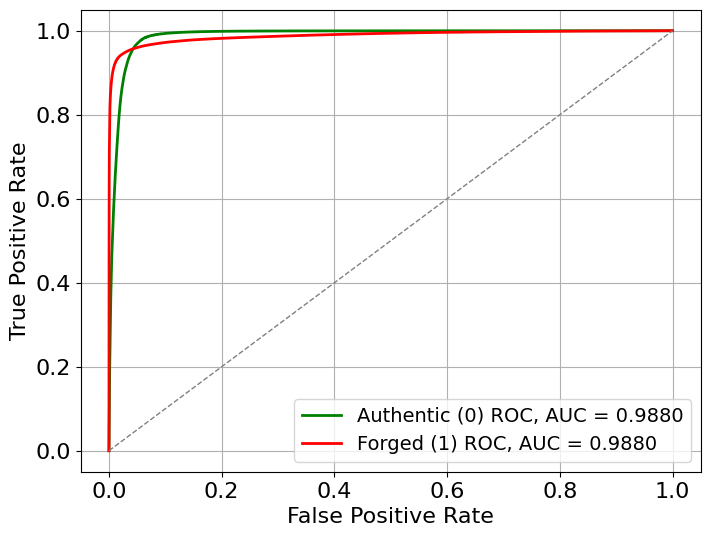

In [113]:
# -----------------------------
# Imports
# -----------------------------
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from tqdm import tqdm

# -----------------------------
# Plot class-wise ROC curves for binary segmentation
# -----------------------------
def plot_classwise_roc(model, loader, device, save_path="roc_curve_classes.png"):
    """
    Plot pixel-wise ROC curves for both classes (Authentic=0, Forged=1) in binary segmentation.
    """
    model.eval()
    all_probs = []
    all_gts = []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Computing Class-wise ROC"):
            images = images.to(device, dtype=torch.float32)
            masks  = masks.to(device, dtype=torch.float32)

            logits = model(images)
            if logits.shape != masks.shape:
                masks = F.interpolate(masks, size=logits.shape[2:], mode='nearest')

            probs = torch.sigmoid(logits).squeeze(1)  # probability for Forged (class 1)
            gts   = masks.squeeze(1)

            all_probs.append(probs.cpu().numpy().reshape(-1))
            all_gts.append(gts.cpu().numpy().reshape(-1))

    # Flatten all batches
    all_probs = np.concatenate(all_probs)
    all_gts   = np.concatenate(all_gts)

    # Class 0 (Authentic) vs rest
    fpr0, tpr0, _ = roc_curve(1 - all_gts, 1 - all_probs)  # invert labels for class 0
    auc0 = roc_auc_score(1 - all_gts, 1 - all_probs)

    # Class 1 (Forged) vs rest
    fpr1, tpr1, _ = roc_curve(all_gts, all_probs)
    auc1 = roc_auc_score(all_gts, all_probs)

    # Plot ROC curves
    plt.figure(figsize=(8,6))
    plt.plot(fpr0, tpr0, color='green', lw=2, label=f'Authentic (0) ROC, AUC = {auc0:.4f}')
    plt.plot(fpr1, tpr1, color='red', lw=2, label=f'Forged (1) ROC, AUC = {auc1:.4f}')
    plt.plot([0,1], [0,1], color='gray', lw=1, linestyle='--')

    plt.xlabel("False Positive Rate", fontsize=16)
    plt.ylabel("True Positive Rate", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.legend(fontsize=14)
    plt.grid(True)

    # Save figure
    plt.savefig(save_path, dpi=500, bbox_inches='tight')
    print(f"Class-wise ROC curves saved to {save_path}")
    plt.show()

# -----------------------------
# Execute ROC plot
# -----------------------------
plot_classwise_roc(model, test_loader, DEVICE, save_path="roc_curve_classes.png")


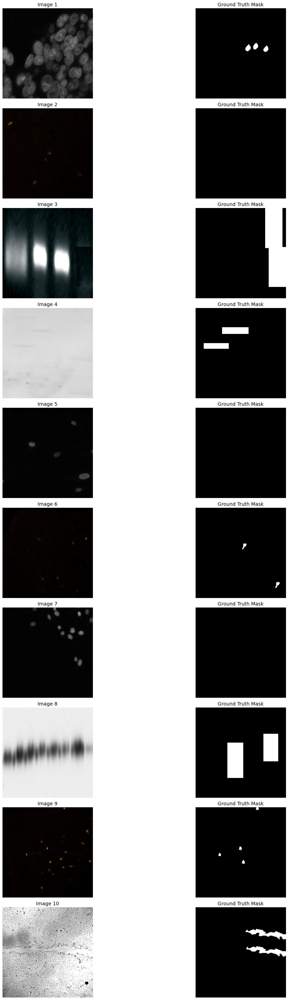

In [29]:
import random
import matplotlib.pyplot as plt

# -----------------------------
# Show 10 random images with GT masks
# -----------------------------
num_samples = 10
indices = random.sample(range(len(dataset)), num_samples)

plt.figure(figsize=(20, 4 * num_samples))

for i, idx in enumerate(indices):
    image, mask = dataset[idx]

    # Image: CHW → HWC
    image_np = image.permute(1, 2, 0).numpy()
    mask_np = mask.squeeze(0).numpy()

    # ---- Original Image ----
    plt.subplot(num_samples, 2, i * 2 + 1)
    plt.imshow(image_np)
    plt.title(f"Image {i+1}", fontsize=14)
    plt.axis("off")

    # ---- Ground Truth Mask ----
    plt.subplot(num_samples, 2, i * 2 + 2)
    plt.imshow(mask_np, cmap="gray")
    plt.title("Ground Truth Mask", fontsize=14)
    plt.axis("off")

plt.tight_layout()
plt.show()


Ends